# Extracting Actionable Insights from FDA Text Data for Healthcare Decision-Making.

### Code by: 

Ujjwal Bhardwaj

A1881450

Master of Data Science 

The University of Adelaide 

### This project investigates the impact of the COVID-19 pandemic on dental implant safety by analyzing adverse event data from the FDA's Medical Device Reporting system using advanced analysis techniques.

# Importing all necessary libraries

In [ ]:
#pip install pandas seaborn tabulate nltk matplotlib wordcloud textblob fuzzywuzzy transformers

In [ ]:
# Importing necessary libraries for data manipulation and visualization
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Libraries for text processing and analysis
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords, wordnet
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob
from collections import Counter
from wordcloud import WordCloud

# Libraries for tabular display and string matching
from tabulate import tabulate
from fuzzywuzzy import process

# Libraries for advanced language models and transformers
from transformers import AutoTokenizer, AutoModelForCausalLM

# Utility libraries
import re
from tqdm import tqdm
import json
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# Downloading necessary NLTK data for text analysis
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
nltk.download('vader_lexicon')


[nltk_data] Downloading package punkt to /home/chahat/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/chahat/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/chahat/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to /home/chahat/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/chahat/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt_tab to /home/chahat/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


# Loading the file

In [ ]:
# Initialize a counter for bad lines if any
bad_line_count = 0

# Define a custom function to count bad lines
def count_bad_line(bad_line):
    global bad_line_count
    bad_line_count += 1
    return None  # Skip the bad line

In [42]:
# Define the file path
file_path = "Final_Research_Dataset.csv"

# Load the file with options for large files and bad line handling
try:
    df = pd.read_csv(
        file_path,
        encoding='latin1',
        on_bad_lines=count_bad_line,   # Use 'error_bad_lines=False' if needed
        engine='python'
    )
    print("File loaded successfully!")
except FileNotFoundError:
    print("Error: File not found. Please check the file path.")
except Exception as e:
    print(f"An error occurred: {e}")

File loaded successfully!


In [43]:
print("Number of bad lines:", bad_line_count)

Number of bad lines: 0


# Getting basic Data Frame Information

This section provides an overview of the dataset, including its structure, column data types, summary statistics, and sample records.


In [44]:
df.describe

<bound method NDFrame.describe of         MDR_REPORT_KEY  DEVICE_EVENT_KEY  IMPLANT_FLAG  DATE_REMOVED_FLAG  \
0              5696651               NaN           NaN                NaN   
1              5784490               NaN           NaN                NaN   
2              6143411               NaN           NaN                NaN   
3              6149790               NaN           NaN                NaN   
4              6231081               NaN           NaN                NaN   
...                ...               ...           ...                ...   
132415        20340310               NaN           NaN                NaN   
132416        20340327               NaN           NaN                NaN   
132417        20340375               NaN           NaN                NaN   
132418        20340417               NaN           NaN                NaN   
132419        20340444               NaN           NaN                NaN   

        DEVICE_SEQUENCE_NO DATE_RECEIVED.

In [45]:
# Display basic information about the DataFrame
df_info = df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132420 entries, 0 to 132419
Columns: 114 entries, MDR_REPORT_KEY to DATE_RECEIVED
dtypes: float64(34), int64(3), object(77)
memory usage: 115.2+ MB


In [46]:
# Displaying the first few rows of the DataFrame
df_head = df.head()
df_head

,MDR_REPORT_KEY,DEVICE_EVENT_KEY,IMPLANT_FLAG,DATE_REMOVED_FLAG,DEVICE_SEQUENCE_NO,DATE_RECEIVED.x,BRAND_NAME,GENERIC_NAME,MANUFACTURER_D_NAME,MANUFACTURER_D_CITY,...,DATE_ADDED,DATE_CHANGED,REPORTER_COUNTRY_CODE,PMA_PMN_NUM,EXEMPTION_NUMBER,SUMMARY_REPORT,NOE_SUMMARIZED,SUPPL_DATES_FDA_RECEIVED,SUPPL_DATES_MFR_RECEIVED,DATE_RECEIVED
0,5696651,NaN,NaN,NaN,1,2016-06-02,INCLUSIVE MINI IMPLANT WITH O-BALL 3.0 MMD X 1...,DENTAL IMPLANT,PRISMATIK DENTALCRAFT INC.,IRVINE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-02
1,5784490,NaN,NaN,NaN,1,2016-07-11,INCLUSIVE TAPERED IMPLANT 4.7 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-07-11
2,6143411,NaN,NaN,NaN,1,2016-12-02,HAHN TAPERED IMPLANT 4.3 X 11.5 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,12/02/2016,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2016-12-02
3,6149790,NaN,NaN,NaN,1,2016-12-06,HAHN TAPERED IMPLANT 3.0 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,12/06/2016,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2016-12-06
4,6231081,NaN,NaN,NaN,1,2017-01-06,HAHN TAPERED IMPLANT 5.0 X 10 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,01/06/2017,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2017-01-06


In [47]:
# Generating a Summary statistics of the DataFrame
df_describe = df.describe(include='all')
df_describe

,MDR_REPORT_KEY,DEVICE_EVENT_KEY,IMPLANT_FLAG,DATE_REMOVED_FLAG,DEVICE_SEQUENCE_NO,DATE_RECEIVED.x,BRAND_NAME,GENERIC_NAME,MANUFACTURER_D_NAME,MANUFACTURER_D_CITY,...,DATE_ADDED,DATE_CHANGED,REPORTER_COUNTRY_CODE,PMA_PMN_NUM,EXEMPTION_NUMBER,SUMMARY_REPORT,NOE_SUMMARIZED,SUPPL_DATES_FDA_RECEIVED,SUPPL_DATES_MFR_RECEIVED,DATE_RECEIVED
count,1.324200e+05,0.0,0.0,0.0,132420.0,132420,132416,132420,132420,132415,...,63031,63031,60985,55034,1.0,63031,63031.0,6303,6303,132420
unique,NaN,NaN,NaN,NaN,NaN,1606,1492,47,47,39,...,826,523,74,51,NaN,1,NaN,651,664,1606
top,NaN,NaN,NaN,NaN,NaN,2017-11-10,"GM HELIX IMPLANT,TI,4.0X10",ENDOSSEOUS DENTAL IMPLANT,JJGC S.A.,CURITIBA,...,11/10/2017,03/07/2018,US,K163194,NaN,N,NaN,08/29/2018,*,2017-11-10
freq,NaN,NaN,NaN,NaN,NaN,3334,3526,129398,104976,126938,...,3334,7337,17431,27041,NaN,63031,NaN,228,2382,3334
mean,1.513033e+07,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5645646.0,NaN,1.0,NaN,NaN,NaN
std,4.133654e+06,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
min,5.696651e+06,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5645646.0,NaN,1.0,NaN,NaN,NaN
25%,1.195048e+07,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5645646.0,NaN,1.0,NaN,NaN,NaN
50%,1.620817e+07,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5645646.0,NaN,1.0,NaN,NaN,NaN
75%,1.867986e+07,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5645646.0,NaN,1.0,NaN,NaN,NaN


In [48]:
# Convert DATE_RECEIVED to datetime to ensure compatibility throughout the study
df['DATE_RECEIVED'] = pd.to_datetime(df['DATE_RECEIVED'], format='%Y-%m-%d', errors='coerce')


In [49]:
# Extract the year and make a seperate column
df['YEAR'] = df['DATE_RECEIVED'].dt.year

# Get the number of distinct years
num_distinct_years = df['YEAR'].nunique()
print(f"Number of distinct years: {num_distinct_years}")

# Display the unique years
unique_years = df['YEAR'].unique()
print(f"Unique years: {unique_years}")


Number of distinct years: 9
Unique years: [2016 2017 2018 2019 2020 2021 2022 2023 2024]


In [50]:
na_values = df['DATE_RECEIVED'].isna()
na_count = na_values.sum()
na_count

0

# Visualization of Data by Year

This section presents the distribution of adverse events over the years, providing insights into yearly trends and highlighting changes in reporting patterns.


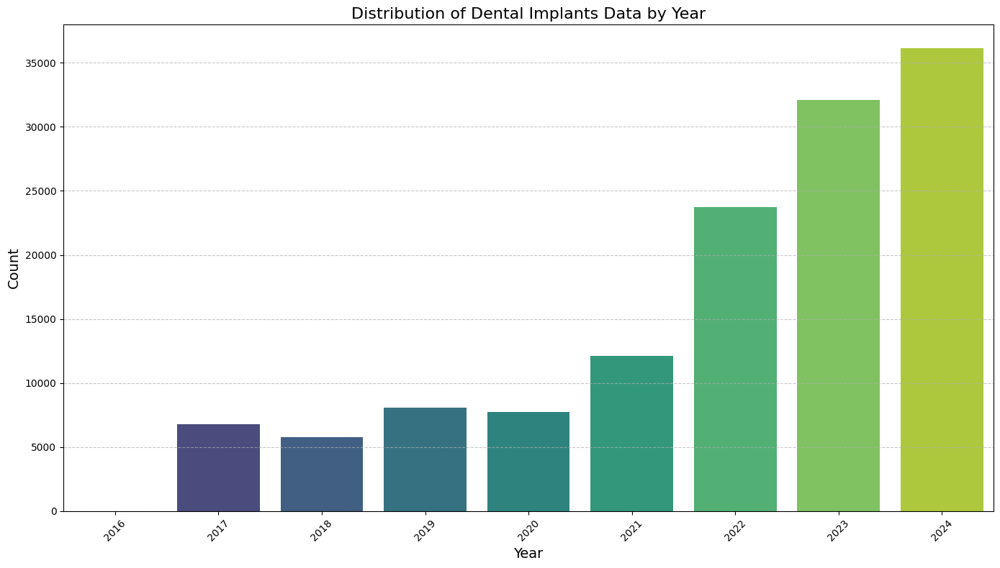

In [51]:
# Ensure 'DATE_RECEIVED' is properly converted to datetime and handle errors gracefully
df['DATE_RECEIVED'] = pd.to_datetime(df['DATE_RECEIVED'], errors='coerce')

# Extract the year from the 'DATE_RECEIVED' column, ensuring it is an integer
df['YEAR'] = df['DATE_RECEIVED'].dt.year


# Convert 'YEAR' column to integer type to remove any floating point values
df['YEAR'] = df['YEAR'].astype(int)

# Group the data by year and count the occurrences
yearly_counts = df['YEAR'].value_counts().sort_index()

# Plot the distribution of the data by year
plt.figure(figsize=(14, 8))
sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="viridis")

plt.title('Distribution of Dental Implants Data by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()


## Performing Lemmatization

In [ ]:
# Initializing the Lemmatizer
lemmatizer = WordNetLemmatizer()

def nltk_lemmatize(text):
    words = word_tokenize(text)
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(lemmatized_words)


In [53]:
df['FOI_TEXT'] = df['FOI_TEXT'].astype(str)
df['FOI_TEXT'] = df['FOI_TEXT'].apply(nltk_lemmatize)

In [54]:
df.head()

,MDR_REPORT_KEY,DEVICE_EVENT_KEY,IMPLANT_FLAG,DATE_REMOVED_FLAG,DEVICE_SEQUENCE_NO,DATE_RECEIVED.x,BRAND_NAME,GENERIC_NAME,MANUFACTURER_D_NAME,MANUFACTURER_D_CITY,...,DATE_CHANGED,REPORTER_COUNTRY_CODE,PMA_PMN_NUM,EXEMPTION_NUMBER,SUMMARY_REPORT,NOE_SUMMARIZED,SUPPL_DATES_FDA_RECEIVED,SUPPL_DATES_MFR_RECEIVED,DATE_RECEIVED,YEAR
0,5696651,NaN,NaN,NaN,1,2016-06-02,INCLUSIVE MINI IMPLANT WITH O-BALL 3.0 MMD X 1...,DENTAL IMPLANT,PRISMATIK DENTALCRAFT INC.,IRVINE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-02,2016
1,5784490,NaN,NaN,NaN,1,2016-07-11,INCLUSIVE TAPERED IMPLANT 4.7 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-07-11,2016
2,6143411,NaN,NaN,NaN,1,2016-12-02,HAHN TAPERED IMPLANT 4.3 X 11.5 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2016-12-02,2016
3,6149790,NaN,NaN,NaN,1,2016-12-06,HAHN TAPERED IMPLANT 3.0 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2016-12-06,2016
4,6231081,NaN,NaN,NaN,1,2017-01-06,HAHN TAPERED IMPLANT 5.0 X 10 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,02/16/2017,US,K143353,NaN,N,1.0,NaN,NaN,2017-01-06,2017


## Finding out the top 300 words for our data (through FOI_TEXT column)

In [55]:
# Defiinge the stop words
stop_words = set(stopwords.words('english'))

# Adding any additional stop words
custom_stop_words = set([
    'implant', 'implants', 'dental', 'patient', 'reported', 'reports', 'buser', 'analainen', 'ganeles', 'studies', 'ada', 'ii' ,'iii', 'iv', 'koldsland', 'et', 'al', 'b', 'manufacturer', 'device', 'production', 
    'process', 'manufacturing', 'distributed', 'may', 'could', 'known', 'applicable', 'trend', 'assures', 'controls', 'confirms', 'ensure', 'confirm', 'one', 'around', 'according', 'case', 'literature', 
    'associated', 'forwarded', 'clinician', 'installed', 'criteria', 'absence', 'dentist', 'met', 'expected', 'scientific', 'based', 'mobility', 'bone', 'analysis', 'inserted', 'risk', 'recurrent', 
    'continuous', 'radiolucency', 'dysesthesia', 'suppuration', 'verified', 'rate', 'number', 'published', 'batch', 'phase', 'loading', 'clinical', 'implantation', 'primary', 'medical', 'accordance', 
    'guidance', 'dietary', 'stored', 'oral', 'specifications', 'batches', 'first', 'product', 'fdi', 'details', 'information', 'customer', 'report', 'postmarketing', 'either', 'form', 'given', 'also', 
    'include', 'seen', 'moreover', 'yet', 'happens', 'recorded', 'immediately', 'item', 'thus', 'fortunately', 'considered', 'whereas', 'singh', 'informations', 'biomechanical', 'submitted', 'documented', 
    'various', 'authors', 'obtained', 'made', 'h', 'e', 'f', 'g', 'c', 'contributed', 'integrate', 'initial', 'subjective', 'within', 'body', 'early', 'might', 'level', 'event', 'presented', 'experienced', 
    'site', 'type', 'products', 'immediate', 'completely', 'upon', 'without', 'carried', 'region', 'day', 'occurred', 'upon', 'subsidiary', 'considering', 'related', 'contribute', 'behalf', 'usa', 'inc', 
    'design', 'visual', 'reporting', 'usually', 'submitting', 'behalf', ])
stop_words = stop_words.union(custom_stop_words)

In [56]:
# Concatenating all the text in FOI_TEXT column
all_text = ' '.join(df['FOI_TEXT'].astype(str).tolist())

# Tokenizing the text
words = word_tokenize(all_text.lower())

# Filtering out the stopwords and non-alphabetic tokens
filtered_words = [word for word in words if word.isalpha() and word not in stop_words]

# Get the most common words
top_words = Counter(filtered_words).most_common(300)

top_words

[('failure', 203153),
 ('success', 190332),
 ('treatment', 177961),
 ('complications', 127393),
 ('pain', 122943),
 ('infection', 107889),
 ('place', 103838),
 ('inherent', 103474),
 ('endosseous', 97327),
 ('removed', 96674),
 ('complaints', 94663),
 ('sensation', 94658),
 ('persistent', 94656),
 ('foreign', 94053),
 ('failures', 83470),
 ('fail', 83281),
 ('healing', 83052),
 ('occlusal', 82578),
 ('year', 82245),
 ('occur', 81534),
 ('injuries', 61971),
 ('due', 55314),
 ('mouth', 51936),
 ('osseointegration', 50724),
 ('surgery', 41025),
 ('loss', 34754),
 ('pandemic', 31936),
 ('stability', 30032),
 ('procedure', 28525),
 ('missing', 24232),
 ('incomplete', 23920),
 ('achieved', 22186),
 ('placed', 18466),
 ('adverse', 16350),
 ('injury', 16213),
 ('serious', 16137),
 ('fda', 16135),
 ('supplements', 16078),
 ('malfunction', 16052),
 ('observed', 16033),
 ('covid', 15994),
 ('returned', 15942),
 ('inadequate', 15881),
 ('covered', 14548),
 ('months', 14535),
 ('removal', 14460),
 

# Generating wordclouds

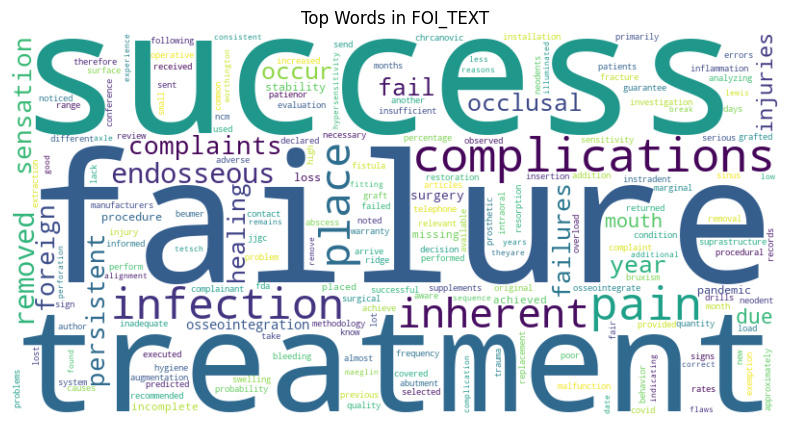

In [57]:
top_words_dict = dict(top_words)

# Generating the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_words_dict)

# Plotting the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Words in FOI_TEXT')
plt.show()

In [58]:
print(tabulate(top_words, headers=['Word', 'Frequency'], tablefmt='grid'))

+----------------------+-------------+
| Word                 |   Frequency |
+======================+=============+
| failure              |      203153 |
+----------------------+-------------+
| success              |      190332 |
+----------------------+-------------+
| treatment            |      177961 |
+----------------------+-------------+
| complications        |      127393 |
+----------------------+-------------+
| pain                 |      122943 |
+----------------------+-------------+
| infection            |      107889 |
+----------------------+-------------+
| place                |      103838 |
+----------------------+-------------+
| inherent             |      103474 |
+----------------------+-------------+
| endosseous           |       97327 |
+----------------------+-------------+
| removed              |       96674 |
+----------------------+-------------+
| complaints           |       94663 |
+----------------------+-------------+
| sensation            | 

## Conducting a basic sentiment analysis of our lemmatized data, using the Textblob library

In [59]:
# Adding TextBlob sentiment analysis
df['polarity'] = df['FOI_TEXT'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Separating the positive and negative words based on polarity
positive_text = ' '.join(df[df['polarity'] > 0]['FOI_TEXT'])
negative_text = ' '.join(df[df['polarity'] < 0]['FOI_TEXT'])

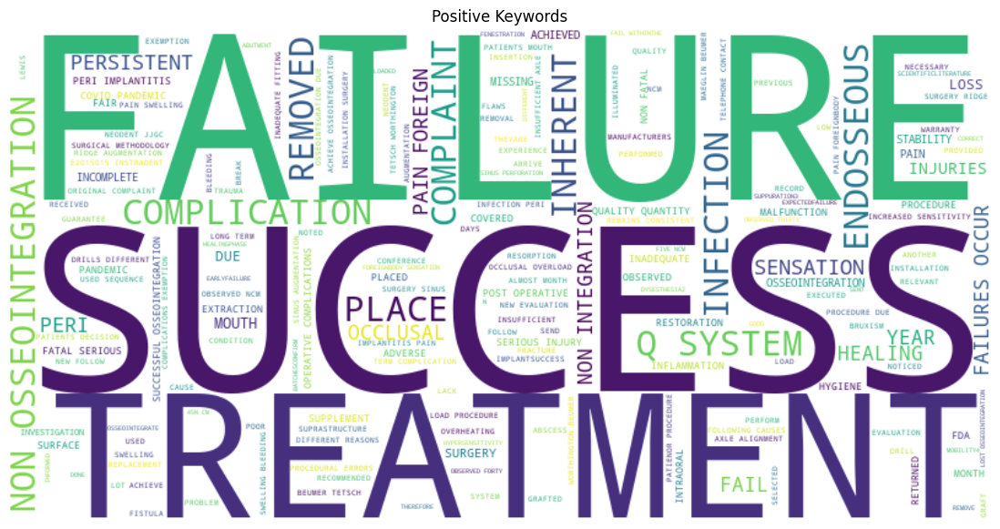

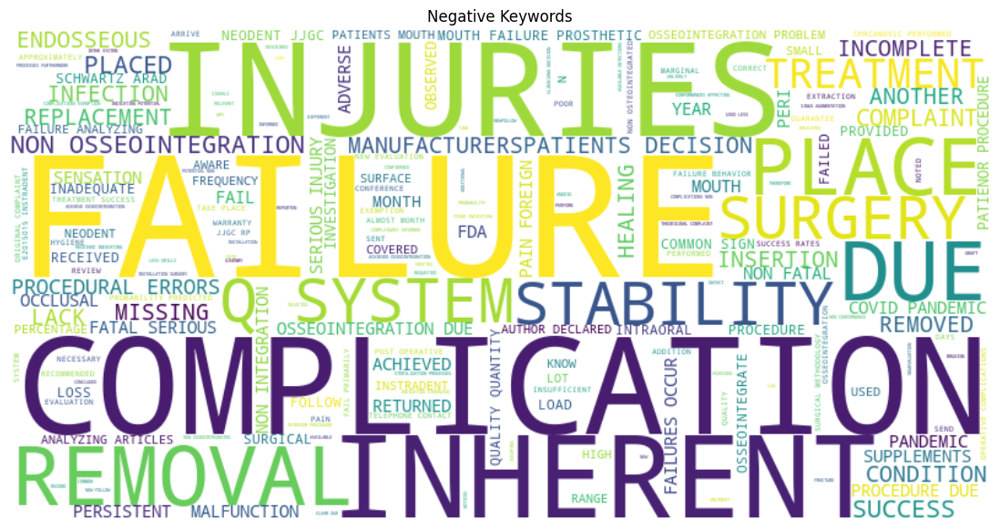

In [60]:
# Generating our word clouds
positive_wordcloud = WordCloud(stopwords=stop_words, width=800, height=400, background_color='white').generate(positive_text)
negative_wordcloud = WordCloud(stopwords=stop_words, width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(15, 7))
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Positive Keywords')
plt.show()

plt.figure(figsize=(15, 7))
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Negative Keywords')
plt.show()


# Initialization of developed keyword mapping table

In [61]:
# Defining our custom keyword mapping table for adverse events
adverse_events_keywords = {
    'Pain': ['injuries', 'injury', 'causes', 'bruxism', 'break', 'disease', 'pain','fracture'],
    'Failure': ['failures', 'loss', 'fail', 'incomplete', 'errors', 'failed', 'failure','insufficient'],
    'Success': ['stability', 'healing', 'achieved', 'successful', 'verified', 'healing','fortunately','implantsuccess'],
    'Complications': ['poor','immediate', 'problem', 'problems', 'complication', 'malfunction', 'serious', 'covid', 'lack', 'flaws', 'complications', 'pandemic', 'dietary', ],
    'Treatment': ['abscess','procedural','operative','surgery', 'procedure', 'intraoral', 'provided', 'received', 'restoration', 'surgical', 'supplements', 'oral', 'intraoral'],
    'Swelling': ['swelling', 'inflammation', 'sinus', 'fracture', 'overheating', 'damage', 'infection'],
    'Stress': ['trauma', 'condition', 'risk', 'recurrent', 'inherent','overload'],
    'Analysis Events': ['documented','noted','report', 'observed', 'investigation', 'evaluation','reporting','recorded','records','review','analyzing','informed'],
    'Implant Operations': ['abutment','drills','installation','performed','perform','load','augmentattion','implantation', 'installed', 'placed', 'insertion', 'replacement', 'performed', 'instradent', 'place', 'endosseous', 'osseointegration'],
    'Bleeding': ['bleeding', 'resorption', 'tissue', 'injuries','fistula','perforation'],
    'Implant Removal': ['removal', 'remove', 'removed', 'missing','extract','extraction',],
    'Complaints': ['complaint', 'inadequate', 'complainant', 'adverse','hygiene'],
    'Sensation': ['experienced', 'sensitivity', 'torqued', 'hypersensitivity', 'experience', 'dysesthesia', 'foreign']
}


table_data = [(event, ', '.join(keywords)) for event, keywords in adverse_events_keywords.items()]
print(tabulate(table_data, headers=['Adverse Event', 'Keywords'], tablefmt='grid'))

+--------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Adverse Event      | Keywords                                                                                                                                                                                     |
+====================+==============================================================================================================================================================================================+
| Pain               | injuries, injury, causes, bruxism, break, disease, pain, fracture                                                                                                                            |
+--------------------+--------------------------------------------------------------------------------------------------------------------------

# Event Classification

### Method 1- Mapping based on counts

In [ ]:
# Function to classify events based on the keyword mapping
def classify_events(text):
    words = word_tokenize(text.lower())
    event_counts = {event: 0 for event in adverse_events_keywords}
    for word in words:
        for event, keywords in adverse_events_keywords.items():
            if word in keywords:
                event_counts[event] += 1
    max_event = max(event_counts, key=event_counts.get)
    return max_event if event_counts[max_event] > 0 else 'Other'

In [ ]:
# Function to count individual events, even if multiple are returned
def count_individual_events(event_str):
    # Split the string on commas to get individual events
    events = [event.strip() for event in event_str.split(',')]
    return events

# Apply the function to classify each event in the FOI_TEXT column
df['EVENT'] = df['FOI_TEXT'].astype(str).apply(classify_events)

# Create a new column that contains lists of individual events (to handle multiple events)
df['EVENT_LIST'] = df['EVENT'].apply(count_individual_events)

# Explode the list into individual rows for proper counting
df_exploded = df.explode('EVENT_LIST')

# Count the occurrences for each event type
event_counts = df_exploded['EVENT_LIST'].value_counts()

# Calculate the percentage for each event type
total_count = event_counts.sum()
event_percentages = (event_counts / total_count) * 100

# Create a summary DataFrame with counts and percentages
event_summary_basic = pd.DataFrame({
    'Event Type': event_counts.index,
    'Count of Adverse Events': event_counts.values,
    'Percentage': event_percentages.values
})

display(event_summary_basic)


,Event Type,Count of Adverse Events,Percentage
0,Failure,77411,58.458692
1,Complications,10606,8.009364
2,Success,10464,7.902130
3,Implant Operations,9784,7.388612
4,Analysis Events,8684,6.557922
5,Treatment,6679,5.043800
6,Pain,6519,4.922972
7,Swelling,1059,0.799728
8,Sensation,510,0.385138
9,Other,413,0.311886


### Method 2- Mapping based on Sentiment Polarity for event count ties

In [ ]:
# Function to use Sentiment polarity if more than 1 event classified with same count
def classify_event_with_sentiment(text):
    # Tokenize and preprocess the text
    words = word_tokenize(text.lower())
    event_counts = {event: 0 for event in adverse_events_keywords}
    
    # Count keyword occurrences for each category
    for word in words:
        for event, keywords in adverse_events_keywords.items():
            if word in keywords:
                event_counts[event] += 1
    
    max_count = max(event_counts.values())
    
    # Get all events with the maximum count
    top_events = [event for event, count in event_counts.items() if count == max_count]
    
    # If only one top event, return it
    if len(top_events) == 1:
        return top_events[0]
    
    # If there's a tie, calculate sentiment
    sentiment = TextBlob(text).sentiment.polarity  # Polarity ranges from -1 (negative) to 1 (positive)
    
    # Assign based on sentiment
    if sentiment < 0:
        # Negative sentiment favors failure-related events
        failure_categories = {"Failure", "Complications", "Pain"}
        for event in top_events:
            if event in failure_categories:
                return event
    elif sentiment > 0:
        # Positive sentiment favors success-related events
        success_categories = {"Success", "Treatment"}
        for event in top_events:
            if event in success_categories:
                return event
    
    # If sentiment is neutral or no match, return the first category
    return top_events[0]


In [65]:
# Function to count individual events, even if multiple are returned
def count_individual_events(event_str):
    # Split the string on commas to get individual events
    events = [event.strip() for event in event_str.split(',')]
    return events

# Apply the function to classify each event in the FOI_TEXT column
df['EVENT'] = df['FOI_TEXT'].astype(str).apply(classify_event_with_sentiment)

# Create a new column that contains lists of individual events (to handle multiple events)
df['EVENT_LIST'] = df['EVENT'].apply(count_individual_events)

# Explode the list into individual rows for proper counting
df_exploded = df.explode('EVENT_LIST')

# Count the occurrences for each event type
event_counts = df_exploded['EVENT_LIST'].value_counts()

# Calculate the percentage for each event type
total_count = event_counts.sum()
event_percentages = (event_counts / total_count) * 100

# Create a summary DataFrame with counts and percentages
event_summary_senti = pd.DataFrame({
    'Event Type': event_counts.index,
    'Count of Adverse Events': event_counts.values,
    'Percentage': event_percentages.values
})

display(event_summary_senti)

,Event Type,Count of Adverse Events,Percentage
0,Failure,74602,56.337411
1,Success,13856,10.463676
2,Complications,10309,7.785078
3,Implant Operations,9784,7.388612
4,Analysis Events,8684,6.557922
5,Treatment,8434,6.369129
6,Pain,4891,3.693551
7,Swelling,1059,0.799728
8,Sensation,510,0.385138
9,Complaints,148,0.111766


### Method 3- Mapping Based on combination of Sentiment Polarity and Category Context

In [ ]:
# Define mappings for sentiment ranges to categories
negative_categories = {"Failure", "Complications", "Pain","Swelling","Stress","Complaints", "Sensation", "Bleeding","Impant Removal"}
positive_categories = {"Success", "Treatment"}
neutral_categories = {"Implant Operations", "Analysis Events", "Sensation"}

def classify_event_with_sentiment_enhanced(text):
    # Tokenize and preprocess the text
    words = [word for word in word_tokenize(text.lower()) if word.isalpha()]
    event_counts = {event: 0 for event in adverse_events_keywords}
    
    # Count keyword occurrences for each category
    for word in words:
        for event, keywords in adverse_events_keywords.items():
            if word in keywords:
                event_counts[event] += 1
    
    # Find the maximum count
    max_count = max(event_counts.values())
    top_events = [event for event, count in event_counts.items() if count == max_count]
    
    # If only one category is dominant, return it
    if len(top_events) == 1:
        return top_events[0]
    
    # Perform sentiment analysis on the text
    sentiment = TextBlob(text).sentiment.polarity  # Polarity ranges from -1 (negative) to 1 (positive)
    
    # Adjust counts based on sentiment polarity
    for event in event_counts.keys():
        if sentiment < -0.2 and event in negative_categories:
            event_counts[event] += abs(sentiment) * 2  # Boost negative sentiment categories
        elif sentiment > 0.2 and event in positive_categories:
            event_counts[event] += sentiment * 2  # Boost positive sentiment categories
        elif -0.2 <= sentiment <= 0.2 and event in neutral_categories:
            event_counts[event] += 1  # Slight boost for neutral categories in neutral sentiment
    
    # Recalculate the maximum after applying sentiment weights
    max_count = max(event_counts.values())
    top_events = [event for event, count in event_counts.items() if count == max_count]
    
    # If there's still a tie, return the first category (or use a custom tie-breaker)
    return top_events[0] if len(top_events) == 1 else ', '.join(top_events)


In [67]:
# Function to count individual events, even if multiple are returned
def count_individual_events(event_str):
    # Split the string on commas to get individual events
    events = [event.strip() for event in event_str.split(',')]
    return events

# Apply the function to classify each event in the FOI_TEXT column
df['EVENT'] = df['FOI_TEXT'].astype(str).apply(classify_event_with_sentiment_enhanced)

# Create a new column that contains lists of individual events (to handle multiple events)
df['EVENT_LIST'] = df['EVENT'].apply(count_individual_events)

# Explode the list into individual rows for proper counting
df_exploded = df.explode('EVENT_LIST')

# Count the occurrences for each event type
event_counts = df_exploded['EVENT_LIST'].value_counts()

# Calculate the percentage for each event type
total_count = event_counts.sum()
event_percentages = (event_counts / total_count) * 100

# Create a summary DataFrame with counts and percentages
event_summary_senti_com = pd.DataFrame({
    'Event Type': event_counts.index,
    'Count of Adverse Events': event_counts.values,
    'Percentage': event_percentages.values
})

display(event_summary_senti_com)

,Event Type,Count of Adverse Events,Percentage
0,Failure,66088,39.832924
1,Implant Operations,31716,19.116043
2,Complications,16771,10.108310
3,Success,14686,8.851627
4,Analysis Events,14067,8.478540
5,Sensation,6168,3.717611
6,Treatment,6009,3.621778
7,Pain,4377,2.638130
8,Bleeding,3217,1.938968
9,Swelling,1863,1.122878


## Comparision of results of the three methods

In [68]:
# Combine the summaries into a single DataFrame for comparison with consistent suffixes
comparison_df = (
    event_summary_basic.set_index('Event Type')
    .join(event_summary_senti.set_index('Event Type'), lsuffix='_basic', rsuffix='_senti')
    .join(event_summary_senti_com.set_index('Event Type'), rsuffix='_senti_com')
).reset_index()

# Fill missing values with zeros (if any exist after joining)
comparison_df.fillna(0, inplace=True)

# Print the combined table
print(tabulate(comparison_df, headers="keys", tablefmt="grid"))

+----+--------------------+---------------------------------+--------------------+---------------------------------+--------------------+---------------------------+--------------+
|    | Event Type         |   Count of Adverse Events_basic |   Percentage_basic |   Count of Adverse Events_senti |   Percentage_senti |   Count of Adverse Events |   Percentage |
+====+====================+=================================+====================+=================================+====================+===========================+==============+
|  0 | Failure            |                           77411 |         58.4587    |                           74602 |         56.3374    |                     66088 |   39.8329    |
+----+--------------------+---------------------------------+--------------------+---------------------------------+--------------------+---------------------------+--------------+
|  1 | Complications      |                           10606 |          8.00936   |             

# Visualizations

In [30]:
# Ensure DATE_RECEIVED column is in datetime format
df['DATE_RECEIVED'] = pd.to_datetime(df['DATE_RECEIVED'], errors='coerce')

# Extract the year and quarter from the DATE_RECEIVED column
df['YEAR'] = df['DATE_RECEIVED'].dt.year
df['QUARTER'] = df['DATE_RECEIVED'].dt.to_period('Q')

<Figure size 1400x1000 with 0 Axes>

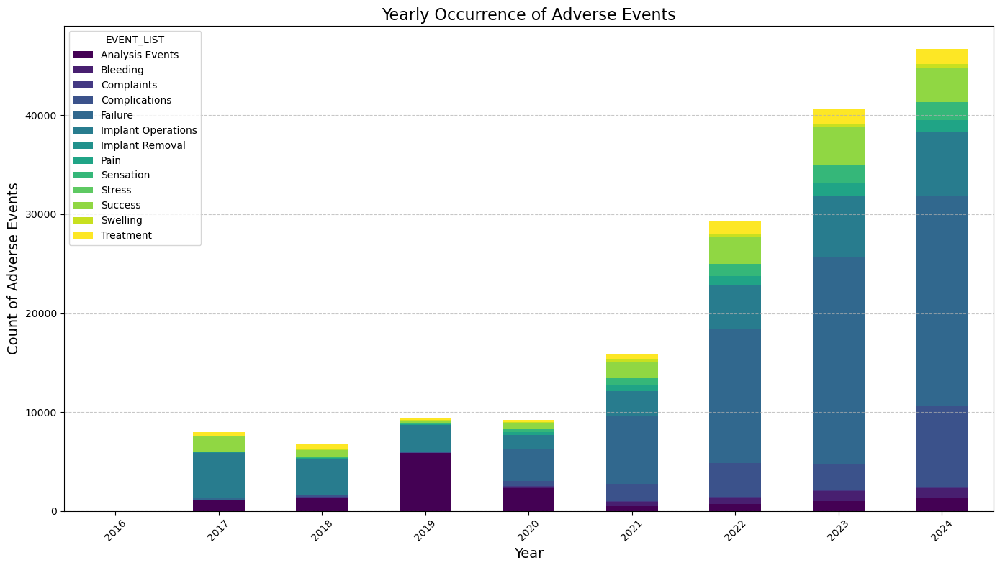

In [ ]:
# Group by both YEAR and EVENT_LIST and count occurrences
yearly_event_counts = df_exploded.groupby(['YEAR', 'EVENT_LIST']).size().reset_index(name='Count')

# Pivot the data to create a table where each row is a year, and each column is an event
pivot_table = yearly_event_counts.pivot(index='YEAR', columns='EVENT_LIST', values='Count').fillna(0)

# Plotting the yearly occurrence of each adverse event using a stacked bar plot
plt.figure(figsize=(14, 10))
pivot_table.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')

# Show the plot
plt.title('Yearly Occurrence of Adverse Events', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count of Adverse Events', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<Figure size 1400x1000 with 0 Axes>

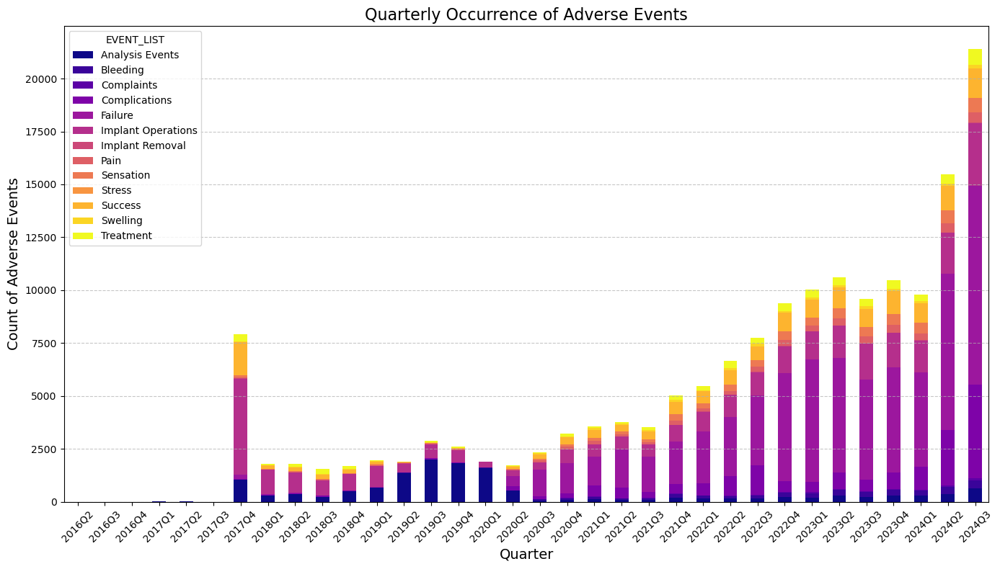

In [ ]:
# Apply the function to classify each event in the FOI_TEXT column
df['EVENT'] = df['FOI_TEXT'].astype(str).apply(classify_event_with_sentiment_enhanced)

# Create a new column that contains lists of individual events (to handle multiple events)
df['EVENT_LIST'] = df['EVENT'].apply(count_individual_events)

# Explode the list into individual rows for proper counting
df_exploded = df.explode('EVENT_LIST')

# Group by both QUARTER and EVENT_LIST and count occurrences
quarterly_event_counts = df_exploded.groupby(['QUARTER', 'EVENT_LIST']).size().reset_index(name='Count')

# Pivot the data to create a table where each row is a quarter, and each column is an event
pivot_table_quarterly = quarterly_event_counts.pivot(index='QUARTER', columns='EVENT_LIST', values='Count').fillna(0)

# Plotting the quarterly occurrence of each adverse event using a stacked bar plot
plt.figure(figsize=(14, 10))
pivot_table_quarterly.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='plasma')

# Display plot
plt.title('Quarterly Occurrence of Adverse Events', fontsize=16)
plt.xlabel('Quarter', fontsize=14)
plt.ylabel('Count of Adverse Events', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

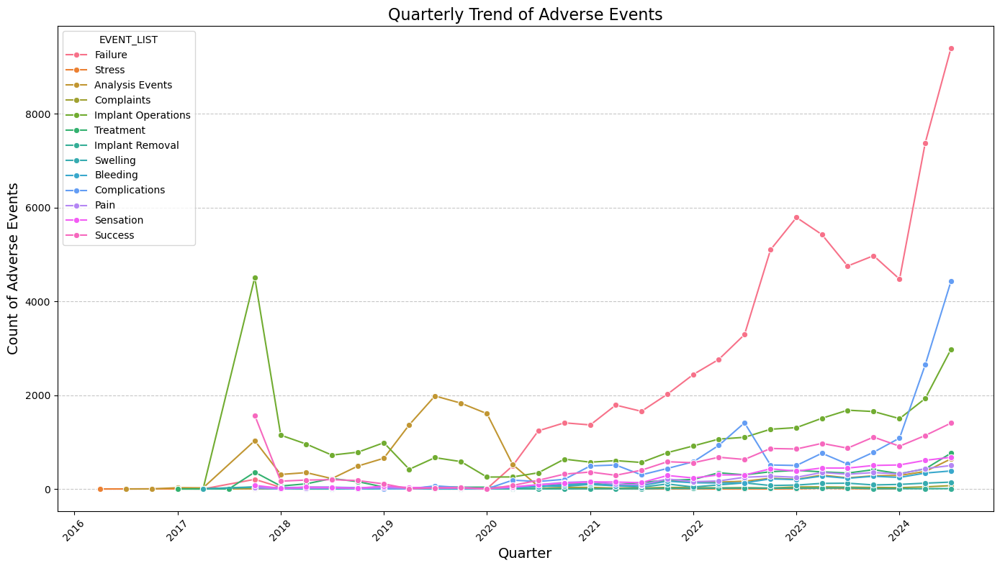

In [ ]:
# Apply the function to classify each event in the FOI_TEXT column
df['EVENT'] = df['FOI_TEXT'].astype(str).apply(classify_event_with_sentiment_enhanced)

# Create a new column that contains lists of individual events (to handle multiple events)
df['EVENT_LIST'] = df['EVENT'].apply(count_individual_events)

# Explode the list into individual rows for proper counting
df_exploded = df.explode('EVENT_LIST')

# Group by both QUARTER and EVENT_LIST and count occurrences
quarterly_event_counts = df_exploded.groupby(['QUARTER', 'EVENT_LIST']).size().reset_index(name='Count')

# Convert QUARTER to datetime for plotting purposes
quarterly_event_counts['QUARTER'] = pd.to_datetime(quarterly_event_counts['QUARTER'].str.replace('Q', '-Q'))

# Create the line plot for each event type over quarters
plt.figure(figsize=(14, 8))
sns.lineplot(data=quarterly_event_counts, x='QUARTER', y='Count', hue='EVENT_LIST', marker='o')

# Display the plot
plt.title('Quarterly Trend of Adverse Events', fontsize=16)
plt.xlabel('Quarter', fontsize=14)
plt.ylabel('Count of Adverse Events', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [34]:
df_exploded

,MDR_REPORT_KEY,DEVICE_EVENT_KEY,IMPLANT_FLAG,DATE_REMOVED_FLAG,DEVICE_SEQUENCE_NO,DATE_RECEIVED.x,BRAND_NAME,GENERIC_NAME,MANUFACTURER_D_NAME,MANUFACTURER_D_CITY,...,SUMMARY_REPORT,NOE_SUMMARIZED,SUPPL_DATES_FDA_RECEIVED,SUPPL_DATES_MFR_RECEIVED,DATE_RECEIVED,YEAR,polarity,EVENT,EVENT_LIST,QUARTER
0,5696651,NaN,NaN,NaN,1,2016-06-02,INCLUSIVE MINI IMPLANT WITH O-BALL 3.0 MMD X 1...,DENTAL IMPLANT,PRISMATIK DENTALCRAFT INC.,IRVINE,...,NaN,NaN,NaN,NaN,2016-06-02,2016,-0.216667,"Failure, Stress",Failure,2016Q2
0,5696651,NaN,NaN,NaN,1,2016-06-02,INCLUSIVE MINI IMPLANT WITH O-BALL 3.0 MMD X 1...,DENTAL IMPLANT,PRISMATIK DENTALCRAFT INC.,IRVINE,...,NaN,NaN,NaN,NaN,2016-06-02,2016,-0.216667,"Failure, Stress",Stress,2016Q2
1,5784490,NaN,NaN,NaN,1,2016-07-11,INCLUSIVE TAPERED IMPLANT 4.7 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,NaN,NaN,NaN,NaN,2016-07-11,2016,-0.175000,Analysis Events,Analysis Events,2016Q3
2,6143411,NaN,NaN,NaN,1,2016-12-02,HAHN TAPERED IMPLANT 4.3 X 11.5 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,N,1.0,NaN,NaN,2016-12-02,2016,0.183333,Analysis Events,Analysis Events,2016Q4
3,6149790,NaN,NaN,NaN,1,2016-12-06,HAHN TAPERED IMPLANT 3.0 X 13 MM,DENTAL IMPLANT,"PRISMATIK DENTALCRAFT, INC.",IRVINE,...,N,1.0,NaN,NaN,2016-12-06,2016,0.102778,Analysis Events,Analysis Events,2016Q4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132415,20340310,NaN,NaN,NaN,1,2024-09-30,"GM HELIX IMPLANT,TI,4.0X11.5",ENDOSSEOUS DENTAL IMPLANT,JJGC S.A.,CURITIBA,...,NaN,NaN,NaN,NaN,2024-09-30,2024,0.033854,Failure,Failure,2024Q3
132416,20340327,NaN,NaN,NaN,1,2024-09-30,CM ALVIM IMPL TI 3.5X8,ENDOSSEOUS DENTAL IMPLANT,JJGC S.A.,CURITIBA,...,NaN,NaN,NaN,NaN,2024-09-30,2024,-0.011508,Complications,Complications,2024Q3
132417,20340375,NaN,NaN,NaN,1,2024-09-30,"GM HELIX IMPLANT,TI,5.0X8",ENDOSSEOUS DENTAL IMPLANT,JJGC S.A.,CURITIBA,...,NaN,NaN,NaN,NaN,2024-09-30,2024,0.049561,Failure,Failure,2024Q3
132418,20340417,NaN,NaN,NaN,1,2024-09-30,"GM HELIX IMPLANT,TI,4.3X11.5",ENDOSSEOUS DENTAL IMPLANT,JJGC S.A.,CURITIBA,...,NaN,NaN,NaN,NaN,2024-09-30,2024,0.004386,Complications,Complications,2024Q3


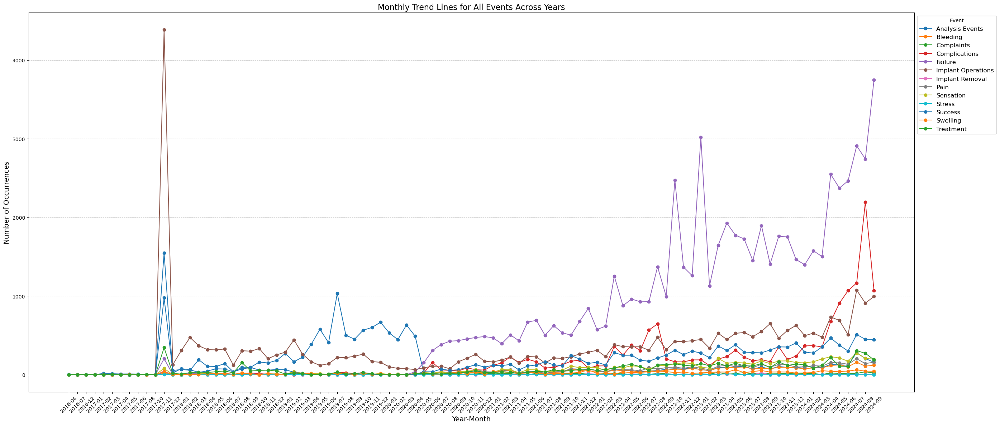

In [35]:
# Explode the list into individual rows for proper grouping (if not already exploded)
df_exploded = df.explode('EVENT_LIST')

# Ensure 'EVENT_LIST' contains string values (not lists)
df_exploded['EVENT_LIST'] = df_exploded['EVENT_LIST'].astype(str)

# Extracting the year and month from the DATE_RECEIVED column
df_exploded['YEAR'] = df_exploded['DATE_RECEIVED'].dt.year
df_exploded['MONTH'] = df_exploded['DATE_RECEIVED'].dt.month
df_exploded['YEAR_MONTH'] = df_exploded['DATE_RECEIVED'].dt.to_period('M')

# Grouping the data by year, month, and event, then count the occurrences
monthly_stats = df_exploded.groupby(['YEAR_MONTH', 'EVENT_LIST']).size().unstack().fillna(0)

# Plotting monthly statistics for all events with trend lines and highlighted points for each year
plt.figure(figsize=(28, 12))

for event in monthly_stats.columns:
    plt.plot(monthly_stats.index.astype(str), monthly_stats[event], marker='o', label=event)

plt.title('Monthly Trend Lines for All Events Across Years', fontsize=16)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Event', loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


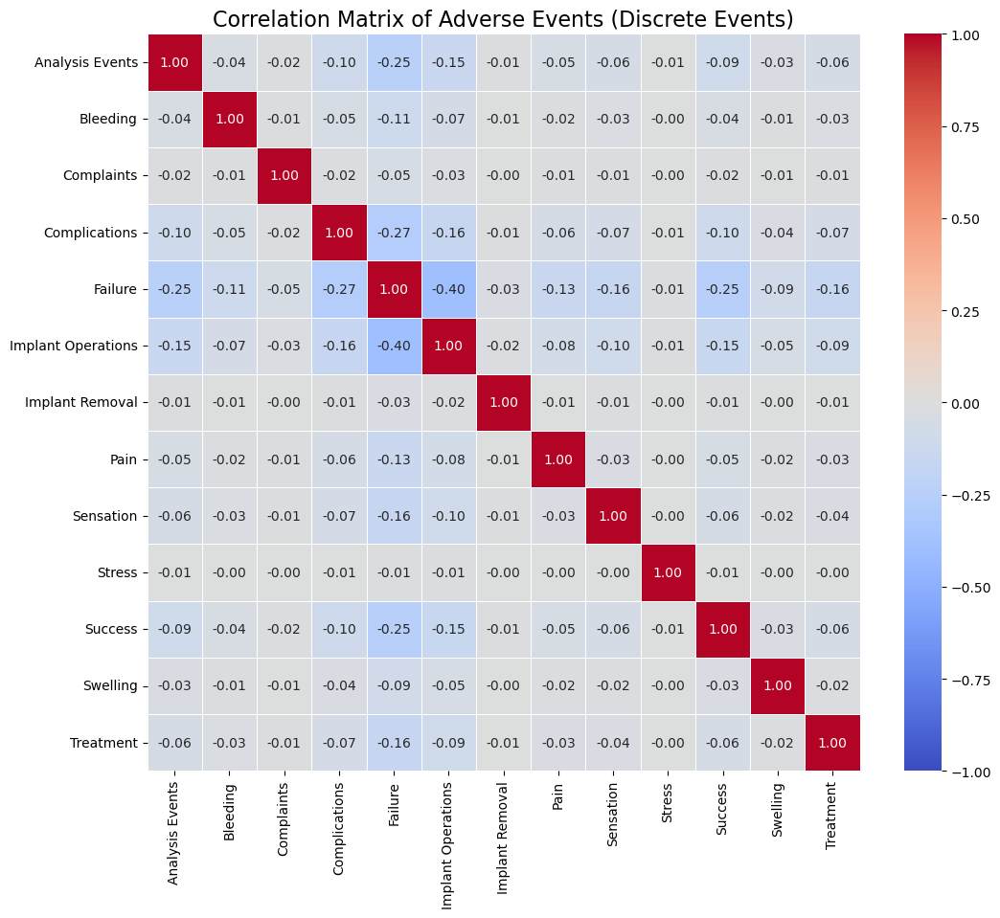

In [ ]:
# Explode the 'EVENT' column to ensure each row contains only one discrete event
df_exploded = df.copy()
df_exploded['EVENT'] = df_exploded['EVENT'].str.split(', ')
df_exploded = df_exploded.explode('EVENT')

# Create the binary occurrence matrix
event_binary_matrix = pd.get_dummies(df_exploded['EVENT'])

# Calculate the correlation matrix
correlation_matrix = event_binary_matrix.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix of Adverse Events (Discrete Events)', fontsize=16)
plt.show()


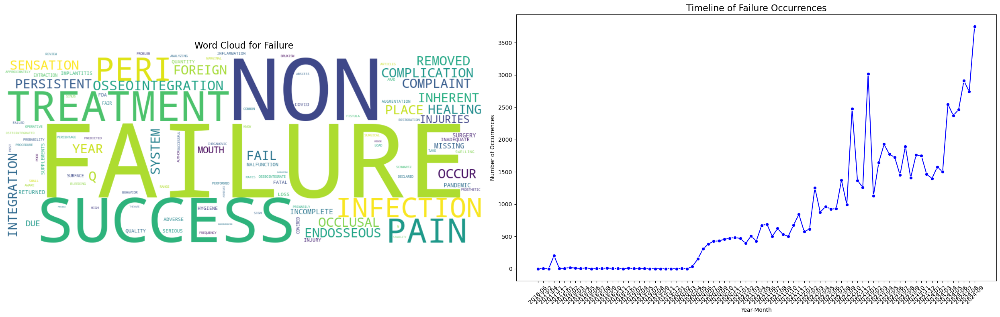

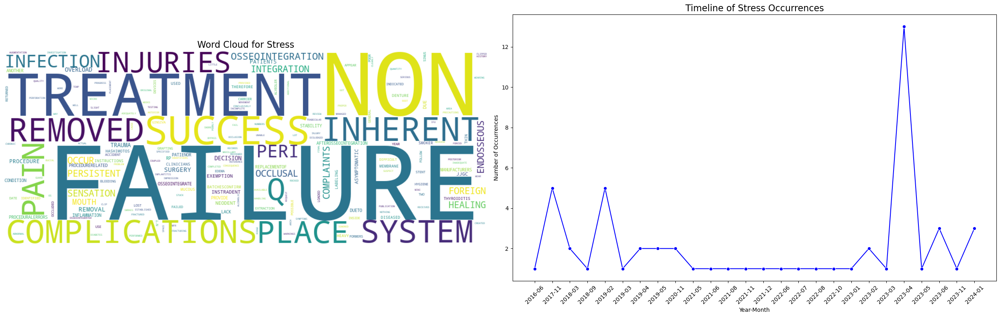

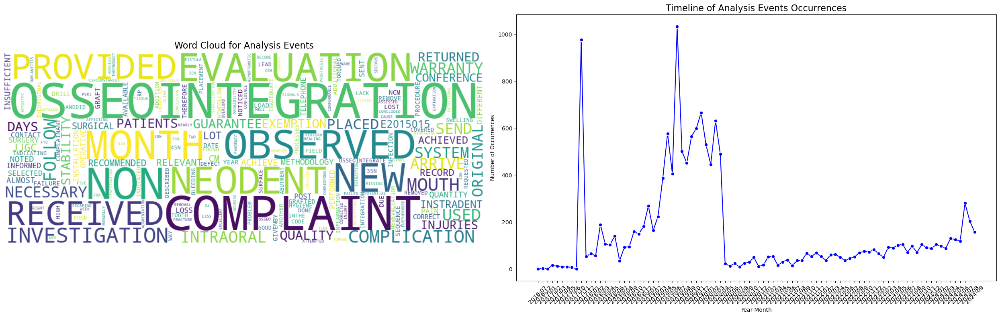

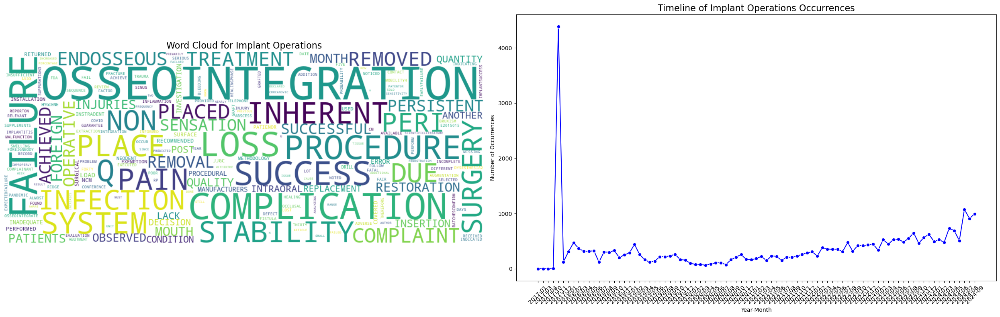

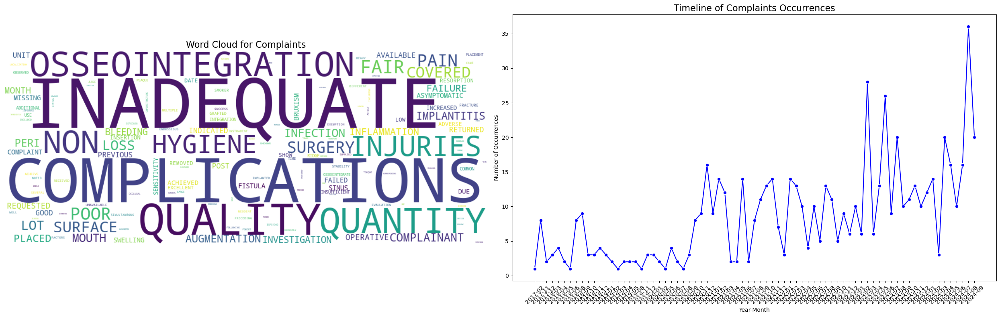

...

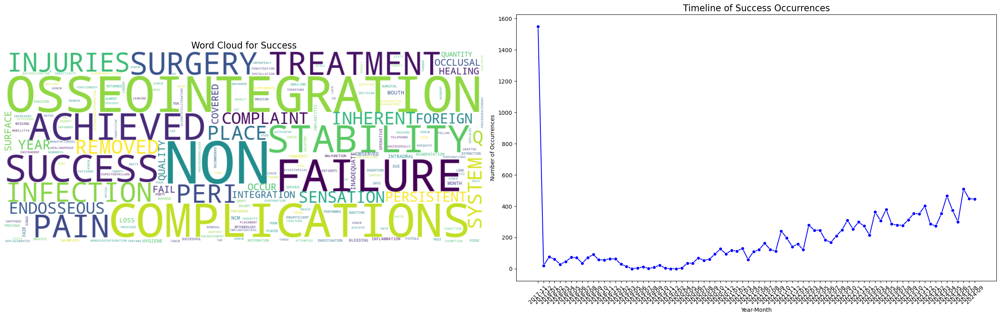

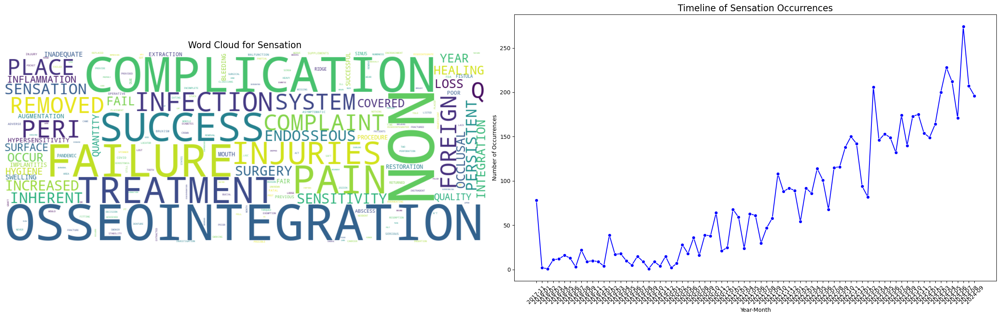

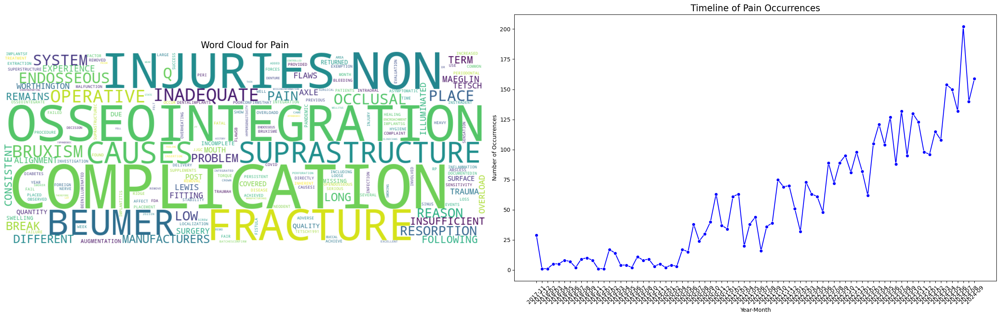

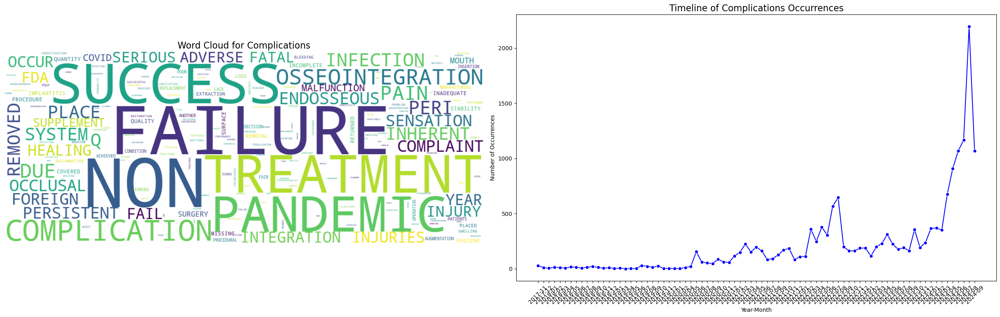

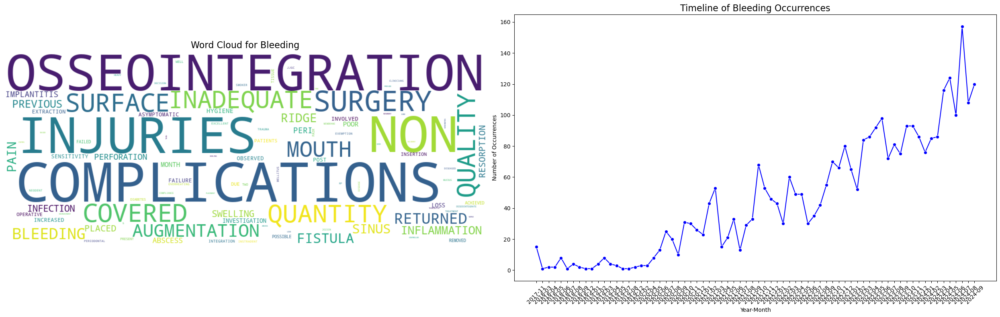

In [ ]:
# Function to generate word clouds
def generate_wordcloud(text):
    wordcloud = WordCloud(
        width=1000, 
        height=400, 
        background_color='white', 
        stopwords=stop_words, 
        collocations=False,  
        max_words=200
    ).generate(text)
    return wordcloud

# Ensure YEAR_MONTH exists
df['YEAR_MONTH'] = df['DATE_RECEIVED'].dt.to_period('M')

# Explode EVENT_LIST column to create individual rows for each event
df_exploded_single = df.explode('EVENT_LIST')

# Ensure YEAR_MONTH exists in the exploded DataFrame
df_exploded_single['YEAR_MONTH'] = df_exploded_single['DATE_RECEIVED'].dt.to_period('M')

# Loop through unique event types
for event_type in df_exploded_single['EVENT_LIST'].unique():
    # Filter rows for the current event type
    event_foi_text = df_exploded_single[df_exploded_single['EVENT_LIST'] == event_type]['FOI_TEXT']
    
    # Concatenate all the FOI_TEXT entries for this event type
    combined_text = ' '.join(event_foi_text.dropna().astype(str))
    
    # Generate word cloud for the current event
    wordcloud = generate_wordcloud(combined_text)
    
    # Prepare the timeline data for the current event
    event_timeline = df_exploded_single[df_exploded_single['EVENT_LIST'] == event_type].groupby('YEAR_MONTH').size()
    
    # Create a figure with two subplots (1 row, 2 columns)
    fig, ax = plt.subplots(1, 2, figsize=(25, 8))
    
    # Plot the word cloud in the first subplot
    ax[0].imshow(wordcloud, interpolation='bilinear')
    ax[0].set_title(f'Word Cloud for {event_type}', fontsize=16)
    ax[0].axis('off')  # Hide axes for the word cloud
    
    # Plot the timeline in the second subplot
    sns.lineplot(x=event_timeline.index.astype(str), y=event_timeline.values, marker='o', ax=ax[1], color='b')
    ax[1].set_title(f'Timeline of {event_type} Occurrences', fontsize=16)
    ax[1].set_xlabel('Year-Month')
    ax[1].set_ylabel('Number of Occurrences')
    ax[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()


<Figure size 1400x800 with 0 Axes>

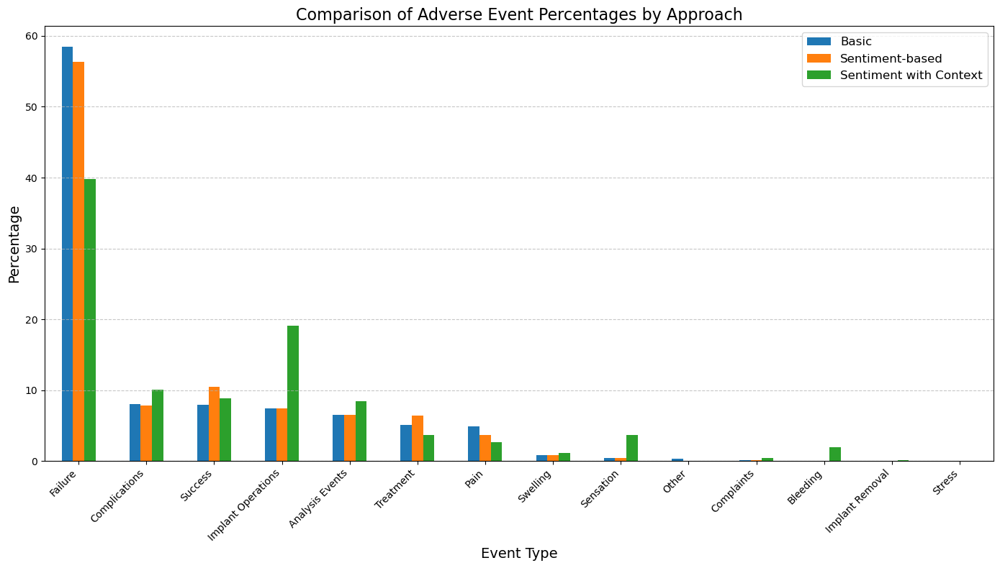

In [38]:
# Plot percentages for each approach
plt.figure(figsize=(14, 8))
comparison_df.plot(
    x='Event Type', 
    y=['Percentage_basic', 'Percentage_senti', 'Percentage'], 
    kind='bar',
    figsize=(14, 8)
)

plt.title("Comparison of Adverse Event Percentages by Approach", fontsize=16)
plt.xlabel("Event Type", fontsize=14)
plt.ylabel("Percentage", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(["Basic", "Sentiment-based", "Sentiment with Context"], fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Severity Level Assessment (using local, open-source LLM)

In [ ]:
# Function to pre-process  and standardize brand names 
def preprocess_and_standardize_names(df, column_name, threshold=90):

    # Preprocess names (remove special characters, normalize spaces, uppercase)
    def preprocess_name(name):
        # Replace special characters with spaces
        name = re.sub(r"[^a-zA-Z0-9]", " ", name)
        # Collapse multiple spaces and trim
        name = re.sub(r"\s+", " ", name).strip()
        # Convert to uppercase
        return name.upper()
    
    # Apply initial preprocessing
    df['CLEAN_MANUFACTURER_NAME'] = df[column_name].apply(preprocess_name)

    # Perform fuzzy matching to group similar names
    unique_clean_names = df['CLEAN_MANUFACTURER_NAME'].unique()

    def map_similar_names(manufacturers, threshold):
        """Maps similar names to a canonical form using fuzzy matching."""
        mapping = {}
        visited = set()
        for name in manufacturers:
            if name not in visited:
                matches = process.extract(name, manufacturers, limit=None)
                for match_name, score in matches:
                    if score >= threshold:
                        mapping[match_name] = name
                        visited.add(match_name)
        return mapping

    # Create a mapping of similar names
    name_mapping = map_similar_names(unique_clean_names, threshold)

    # Apply the mapping to create a final standardized column
    df['FINAL_MANUFACTURER_NAME'] = df['CLEAN_MANUFACTURER_NAME'].replace(name_mapping)

    return df

In [ ]:
df = preprocess_and_standardize_names(df, column_name='MANUFACTURER_D_NAME', threshold=90)

In [ ]:
# Get the truly unique manufacturers
final_unique_manufacturers = df['FINAL_MANUFACTURER_NAME'].unique()

# Print the results
print(f"Total unique manufacturers after complete preprocessing: {len(final_unique_manufacturers)}")
print("List of unique manufacturers:")
print(final_unique_manufacturers)

Total unique manufacturers after complete preprocessing: 27
List of unique manufacturers:
['PRISMATIK DENTALCRAFT INC' 'NOBEL BIOCARE AB PRODUCTION' 'ZIMMER DENTAL'
 'DENTIUM CO' 'NEODENT JJGC S A' 'THOMMEN MEDICAL AG'
 'DRS INTERNATIONAL GMBH' 'MEGAGEN' 'INTRA LOCK INTERNATIONAL INC'
 'HAGER MEISINGER GMBH' 'VULCAN CUSTOM DENTAL' 'BOCCHETTI DR TOMMASO'
 'NOBEL BIOCARE USA LLC' 'DENTAL365' 'INSTITUT STRAUMANN AG'
 'OSSTEM CO LTD' 'ACE SURGICAL SUPPLY CO' 'BIOTECH DENTAL'
 'ADIN DENTAL IMPLANT SYSTEMS LTD' 'DR ANDREW GLENN' 'BIOMET 3I'
 'OSSTEM IMPLANT CO LTD' 'ALTATEC GMBH' 'BIOHORIZONS INC'
 'DITRON DENTAL LTD' 'S I N IMPLANT SYSTEM' 'ADIM DENTAL IMPLANTS LTD']


In [ ]:
# Replace the original manufacturer names with the cleaned and standardized names
df['MANUFACTURER_D_NAME'] = df['FINAL_MANUFACTURER_NAME']

# Drop intermediate columns if no longer needed
df.drop(columns=['CLEAN_MANUFACTURER_NAME', 'FINAL_MANUFACTURER_NAME'], inplace=True)

print("Replaced main manufacturer names with standardized names.")

Replaced main manufacturer names with standardized names.


In [21]:
df_random = df.sample(10000, random_state=42).reset_index(drop=True)

In [ ]:
# Function to split df_random into 10 files, each with 1000 entries
def split_data(df, num_parts=10):
    for i in range(num_parts):
        start = i * 1000
        end = (i + 1) * 1000
        df_part = df.iloc[start:end]
        file_name = f"data_part_{i + 1}.csv"
        df_part.to_csv(file_name, index=False)
        print(f"Saved {file_name} with {len(df_part)} entries.")

split_data(df_random)

Saved data_part_1.csv with 1000 entries.
Saved data_part_2.csv with 1000 entries.
Saved data_part_3.csv with 1000 entries.
Saved data_part_4.csv with 1000 entries.
Saved data_part_5.csv with 1000 entries.
Saved data_part_6.csv with 1000 entries.
Saved data_part_7.csv with 1000 entries.
Saved data_part_8.csv with 1000 entries.
Saved data_part_9.csv with 1000 entries.
Saved data_part_10.csv with 1000 entries.


In [ ]:
# Load the local LLM model and tokenizer
print("Loading the model and tokenizer...")
model_name = "EleutherAI/gpt-neo-1.3B"  # Replace with a different model if needed
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Add padding token if not already set
if tokenizer.pad_token is None:
    print("Adding padding token...")
    tokenizer.add_special_tokens({'pad_token': '[PAD]'})
    model.resize_token_embeddings(len(tokenizer))  # Resize model embeddings

Loading the model and tokenizer...

Adding padding token...


The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


In [ ]:
# Function to send each FOI text to LLM and get a Severity Level based on the prompt given
def classify_severity(text, model, tokenizer, max_new_tokens=10):
    prompt = f"""
    Analyze the following text for severity level of the adverse event:

    {text}

    Severity Scale:
    1 - Critical: Severe or life-threatening issues (e.g., "Severe tissue damage leading to bleeding and fracture requiring surgery.").
    2 - Negative: Significant problems needing intervention (e.g., "Implant failure due to infection.").
    3 - Neutral: Some challenges, but manageable (e.g., "Localized infection treated with complications.").
    4 - Positive: Minor challenges resolved successfully (e.g., "Mild discomfort during healing.").
    5 - Very Positive: No issues or perfect success (e.g., "The implant healed with success.").

    Respond with only the severity level (1, 2, 3, 4, or 5).
    """

    # Tokenize the input prompt with attention mask
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True, padding=True)

    # Generate a response
    outputs = model.generate(
        input_ids=inputs.input_ids,
        attention_mask=inputs.attention_mask,
        max_new_tokens=max_new_tokens,
        num_return_sequences=1,
        do_sample=False,
        pad_token_id=tokenizer.pad_token_id
    )

    # Decode the model's output
    response = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return response.strip()

# Preprocessing to extract key sentences
def extract_key_info(text):
    """
    Extract key sentences or phrases indicating success, failure, or challenges.
    """
    keywords = ["failure", "infection", "pain", "complications", "success", "healing", "discomfort"]
    sentences = [sentence.strip() for sentence in text.split(".") if any(keyword in sentence.lower() for keyword in keywords)]
    return ". ".join(sentences)


In [ ]:

# Function to process a single part of the dataset
def process_file(file_name, output_file_name, model, tokenizer):
    
    # Load the current part
    print(f"Processing {file_name}...")
    df_part = pd.read_csv(file_name)

    # Extract key information
    print("Extracting key information...")
    df_part['KEY_INFO'] = df_part['FOI_TEXT'].astype(str).apply(extract_key_info)

    # Apply severity classification
    print("Classifying severity levels...")
    df_part['SEVERITY_RESPONSE'] = [
        classify_severity(text, model, tokenizer) for text in tqdm(df_part['KEY_INFO'], desc=f"Processing {file_name}")
    ]

    # Extract severity levels
    print("Extracting severity levels...")
    df_part['SEVERITY_LEVEL'] = df_part['SEVERITY_RESPONSE'].apply(extract_severity_level)

    # Save the processed part
    df_part.to_csv(output_file_name, index=False)
    print(f"Processed data saved to {output_file_name}.")


def extract_severity_level(response):
    # Extract severity level from the model's response
    print("Extracting severity levels from responses...")
    match = re.search(r"\b[1-5]\b", response)
    return int(match.group(0)) if match else None

In [31]:
# Example of processing one part
file_to_process = "data_part_5.csv"
output_file = "processed_data_part_5.csv"

In [32]:
process_file(file_to_process, output_file, model, tokenizer)

Processing data_part_5.csv...
Extracting key information...
Classifying severity levels...


Processing data_part_5.csv: 100%|████████████████████████████████████████████████| 1000/1000 [1:37:55<00:00,  5.88s/it]


Extracting severity levels...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity levels from responses...
Extracting severity level

In [ ]:
df_combined = ""

# Combine all processed parts into one final file
def combine_processed_files(num_parts=10):
    processed_files = [f"processed_data_part_{i + 1}.csv" for i in range(num_parts)]
    df_combined = pd.concat([pd.read_csv(file) for file in processed_files], ignore_index=True)
    df_combined.to_csv("Final_Processed_Data_E.csv", index=False)
    print("All parts combined and saved as Final_Processed_Data.csv.")

combine_processed_files()

All parts combined and saved as Final_Processed_Data.csv.


# Vizualisations

In [19]:
severity_colors = {
    1: 'green',    # Minor
    2: 'blue',     # Low
    3: 'orange',   # Moderate
    4: 'red',      # High
    5: 'purple'    # Critical
}


Plotting severity level distribution...


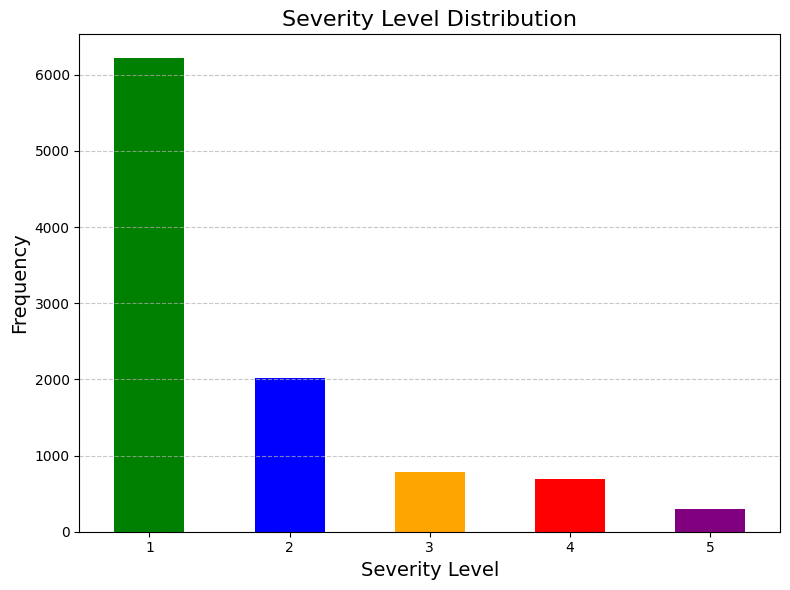

Bar graph plotted and saved as 'Severity_Level_Distribution.png'.


In [ ]:
# Plotting the distribution of the severity levels from the analysis
print("\nPlotting severity level distribution...")
severity_counts = df_combined['SEVERITY_LEVEL'].value_counts().sort_index()

# Ensure the bars of the severity_levels with severity_colors
bar_colors = [severity_colors.get(level, 'gray') for level in severity_counts.index]

plt.figure(figsize=(8, 6))
severity_counts.plot(kind='bar', color=bar_colors) 

# Show the plot
plt.title('Severity Level Distribution', fontsize=16)
plt.xlabel('Severity Level', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.savefig("Severity_Level_Distribution.png")
plt.show()
print("Bar graph plotted and saved as 'Severity_Level_Distribution.png'.")


In [4]:
# Count distinct manufacturers in the random subset
distinct_manufacturers = df_combined['MANUFACTURER_D_NAME'].nunique()
print(f"Number of distinct manufacturers in random_df: {distinct_manufacturers}")


Number of distinct manufacturers in random_df: 13


In [7]:
# Ensure 'DATE_RECEIVED' is in datetime format
df_combined['DATE_RECEIVED'] = pd.to_datetime(df_combined['DATE_RECEIVED'], errors='coerce')

# Extract the year
df_combined['YEAR'] = df_combined['DATE_RECEIVED'].dt.year

# Group by year and severity level
severity_trends = df_combined.groupby(['YEAR', 'SEVERITY_LEVEL']).size().reset_index(name='Count')

# Pivot the table for visualization
pivot_table = severity_trends.pivot(index='YEAR', columns='SEVERITY_LEVEL', values='Count').fillna(0)

print(pivot_table)


SEVERITY_LEVEL       1      2      3      4     5
YEAR                                             
2016               0.0    0.0    1.0    0.0   0.0
2017               0.0    0.0  222.0  191.0  83.0
2018               0.0    0.0  207.0  153.0  76.0
2019               0.0    0.0  255.0  255.0  89.0
2020             255.0   85.0   99.0   89.0  47.0
2021             702.0  250.0    0.0    0.0   0.0
2022            1370.0  442.0    0.0    0.0   0.0
2023            1817.0  568.0    0.0    0.0   0.0
2024            2075.0  669.0    0.0    0.0   0.0


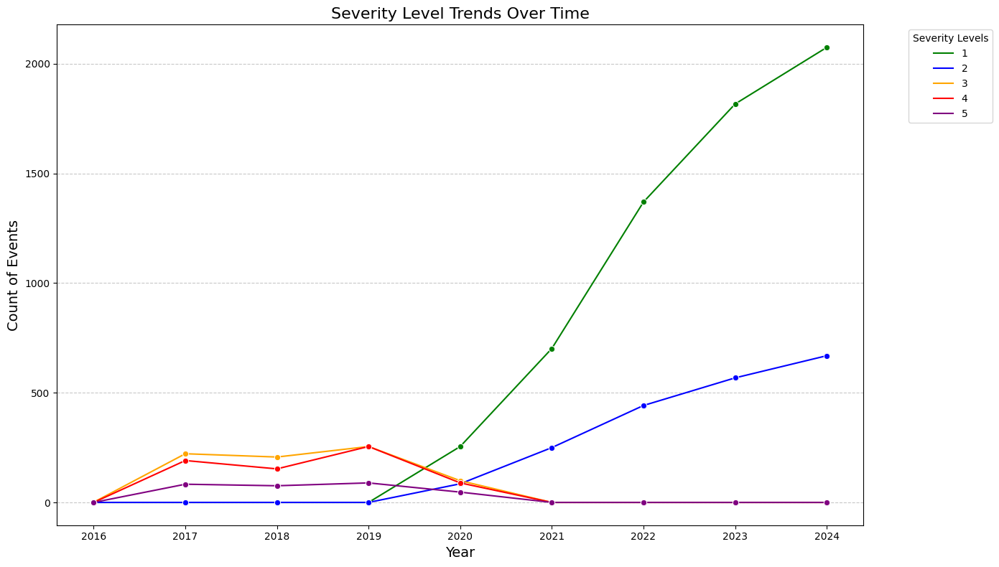

In [ ]:
# Reset the pivot table to long format for seaborn
pivot_table_long = pivot_table.reset_index().melt(
    id_vars='YEAR', var_name='Severity Level', value_name='Count'
)

# Create the line plot with markers using seaborn
plt.figure(figsize=(14, 8))
sns.lineplot(
    data=pivot_table_long,
    x='YEAR',
    y='Count',
    hue='Severity Level',
    palette=severity_colors,
    marker='o'  # Add dot points
)

# Show the plot
plt.title('Severity Level Trends Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count of Events', fontsize=14)
plt.legend(title="Severity Levels", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


In [6]:
# Group by manufacturer and severity level
manufacturer_severity = df_combined.groupby(['MANUFACTURER_D_NAME', 'SEVERITY_LEVEL']).size().reset_index(name='Count')

# Pivot the table for easier visualization
pivot_table_manufacturer = manufacturer_severity.pivot(index='MANUFACTURER_D_NAME', columns='SEVERITY_LEVEL', values='Count').fillna(0)

print(pivot_table_manufacturer)


SEVERITY_LEVEL                        1       2      3      4      5
MANUFACTURER_D_NAME                                                 
ADIN DENTAL IMPLANT SYSTEMS LTD    12.0     2.0    0.0    0.0    0.0
BIOHORIZONS INC                     1.0     0.0    0.0    0.0    0.0
BIOTECH DENTAL                      8.0     3.0    0.0    0.0    0.0
BOCCHETTI DR TOMMASO                0.0     0.0    1.0    0.0    0.0
DITRON DENTAL LTD                  27.0     5.0    0.0    0.0    0.0
INTRA LOCK INTERNATIONAL INC        0.0     0.0    9.0    5.0    4.0
JJGC S A                         5996.0  1950.0  742.0  659.0  284.0
MEGAGEN                             0.0     0.0    0.0    1.0    0.0
PRISMATIK DENTALCRAFT INC           0.0     0.0   12.0    8.0    2.0
S I N IMPLANT SYSTEM              112.0    28.0    0.0    0.0    0.0
THOMMEN MEDICAL AG                 63.0    26.0   19.0   14.0    5.0
VULCAN CUSTOM DENTAL                0.0     0.0    0.0    1.0    0.0
ZIMMER DENTAL                     

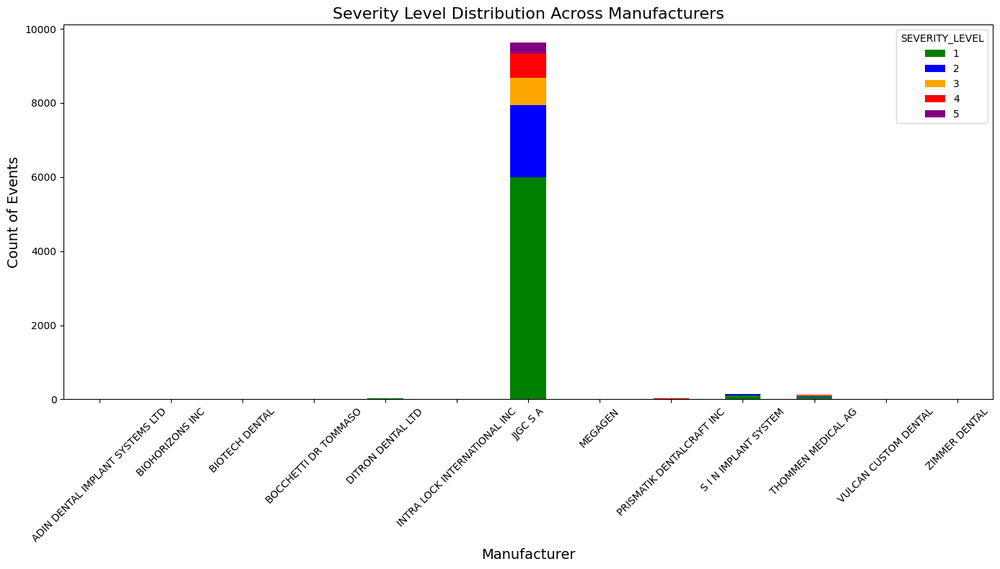

In [ ]:
# Group by severity level
severity_by_manufacturer = df_combined.groupby(['MANUFACTURER_D_NAME', 'SEVERITY_LEVEL']).size().unstack(fill_value=0)


# Ensure the columns of the severity_by_manufacturer DataFrame align with severity_colors
colors = [severity_colors.get(level, 'gray') for level in severity_by_manufacturer.columns]

# Plot a stacked bar chart
severity_by_manufacturer.plot(kind='bar', stacked=True, figsize=(14, 8), color=colors)

# Show the plot
plt.title('Severity Level Distribution Across Manufacturers', fontsize=16)
plt.xlabel('Manufacturer', fontsize=14)
plt.ylabel('Count of Events', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


In [ ]:
# Find the number of unique values in the 'model_number' column
unique_model_numbers = df_combined['MODEL_NUMBER'].nunique()
print(f"The 'MODEL_NUMBER' column has {unique_model_numbers} unique values.")

# Count the occurrences of each unique value in the 'model_number' column
top_models = df_combined['MODEL_NUMBER'].value_counts().head(10)
print("Top 10 most used models:")
print(top_models)

The 'model_number' column has 486 unique values.
Top 10 most used models:
MODEL_NUMBER
109.944    139
109.983    134
140.951    128
140.945    110
140.944    108
109.945    107
140.946    100
109.977     95
109.978     93
109.984     92
Name: count, dtype: int64


<Figure size 1400x800 with 0 Axes>

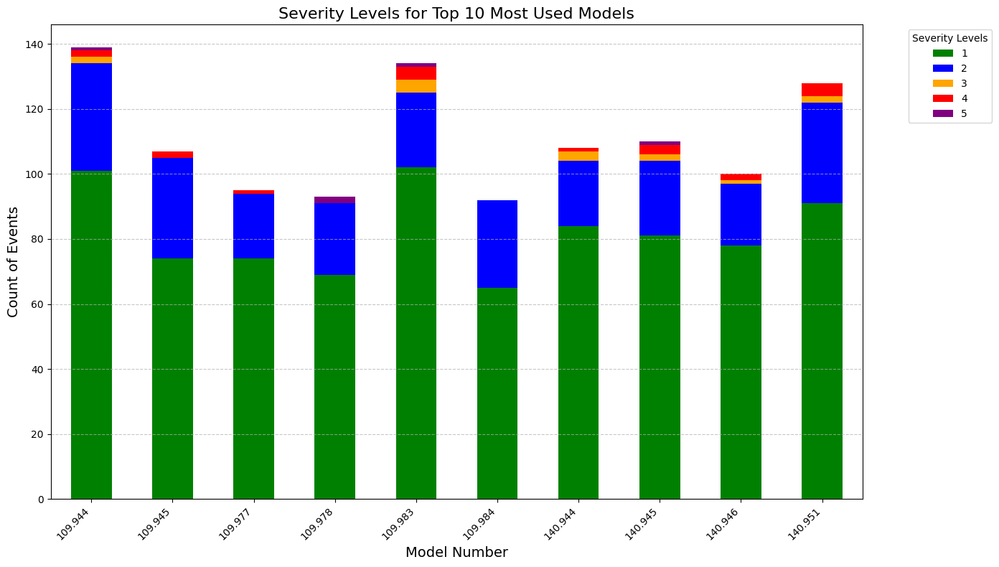

In [ ]:
# Identify the top 10 most used models
top_models = df_combined['MODEL_NUMBER'].value_counts().head(10).index

# Filter the dataset for the top 10 models
filtered_df = df_combined[df_combined['MODEL_NUMBER'].isin(top_models)]

# Group by model_number and SEVERITY_LEVEL, then count occurrences
severity_by_model = filtered_df.groupby(['MODEL_NUMBER', 'SEVERITY_LEVEL']).size().unstack(fill_value=0)

# Align the columns with severity_colors
colors = [severity_colors.get(level, 'gray') for level in severity_by_model.columns]

# Plot a stacked bar chart
plt.figure(figsize=(14, 8))
severity_by_model.plot(kind='bar', stacked=True, figsize=(14, 8), color=colors)

# Show the plot
plt.title('Severity Levels for Top 10 Most Used Models', fontsize=16)
plt.xlabel('Model Number', fontsize=14)
plt.ylabel('Count of Events', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Severity Levels", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


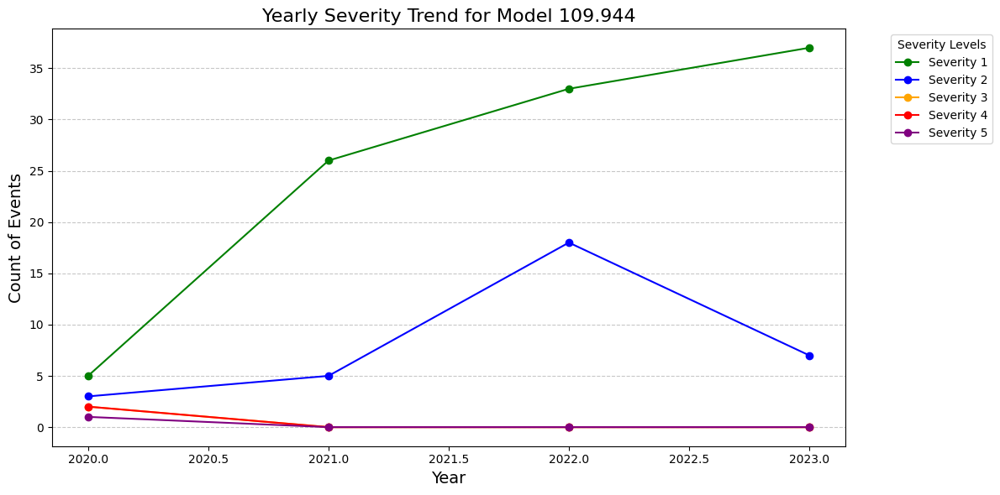

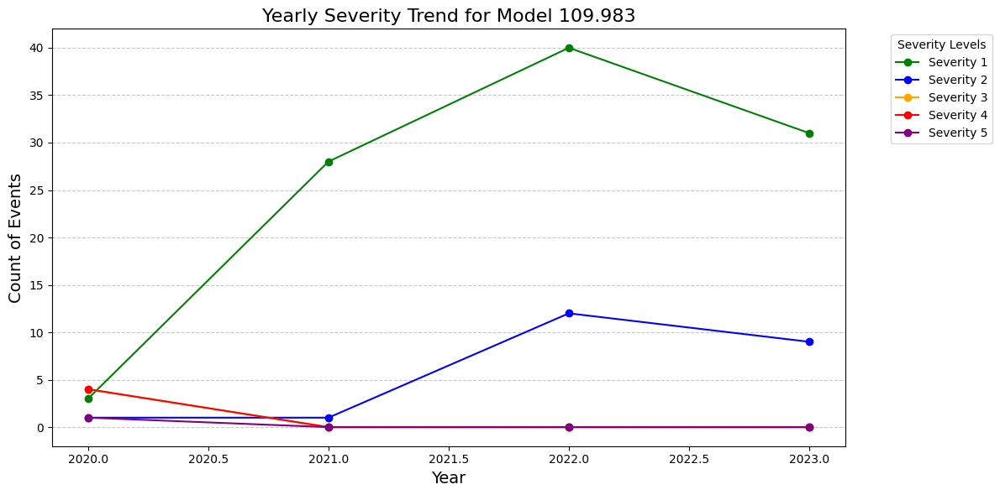

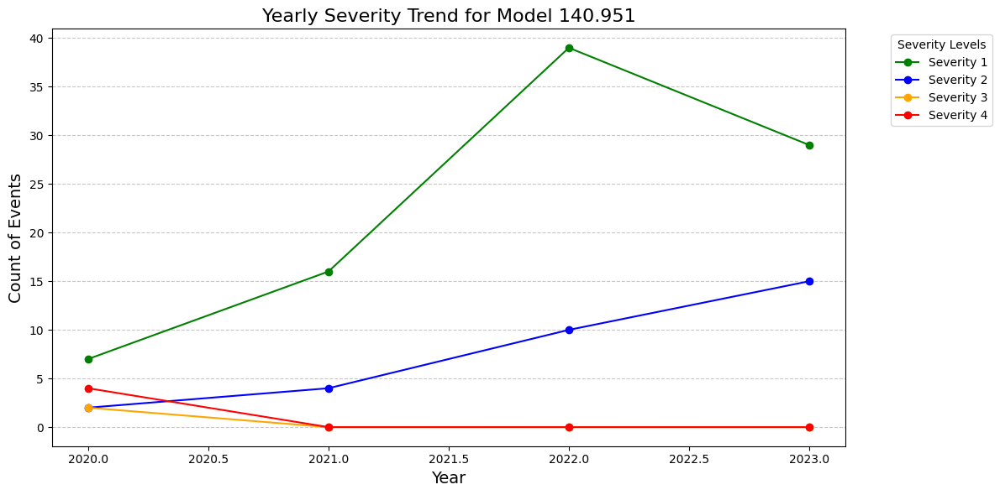

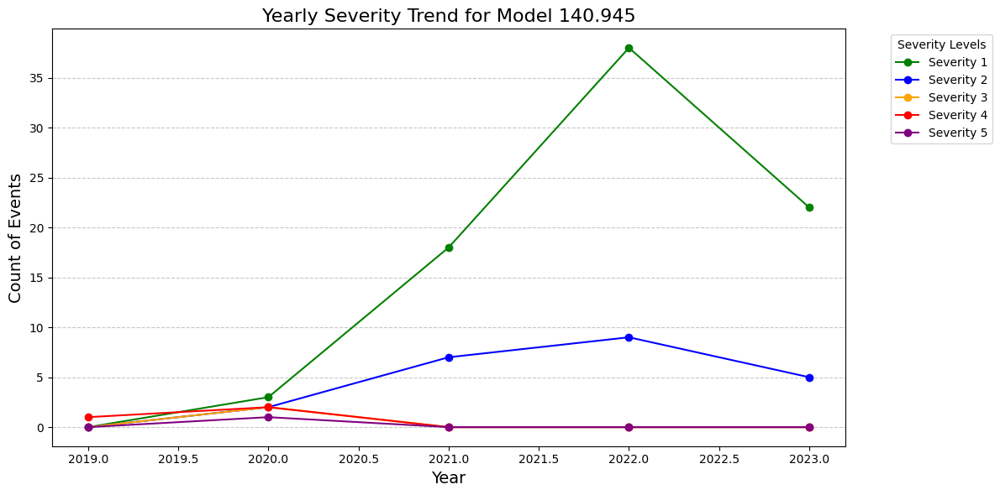

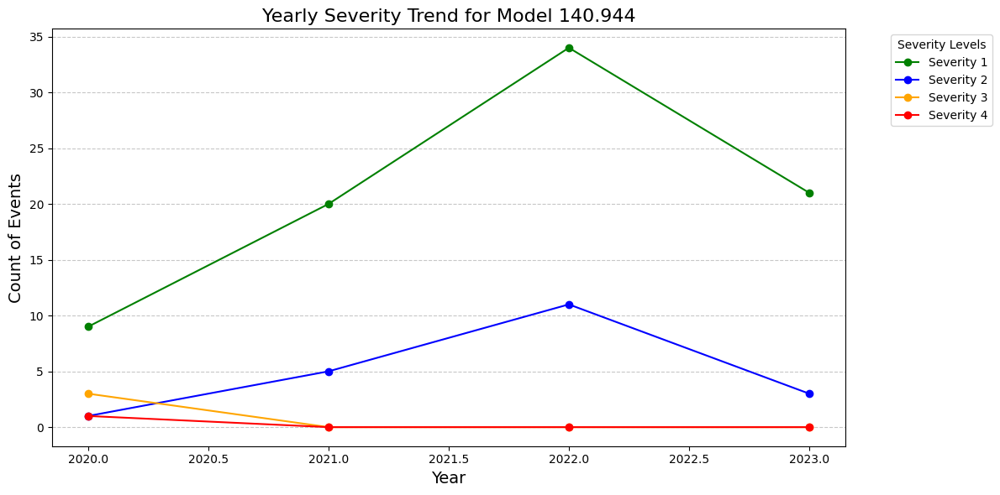

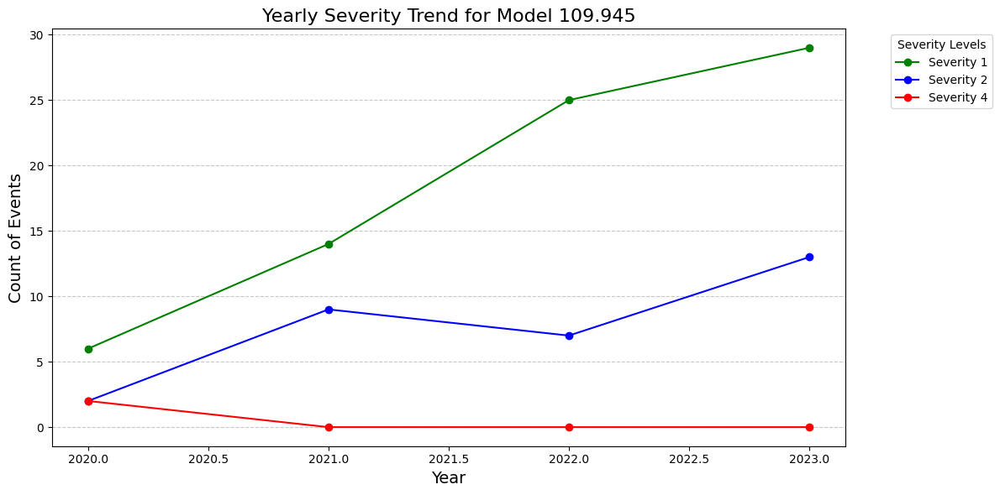

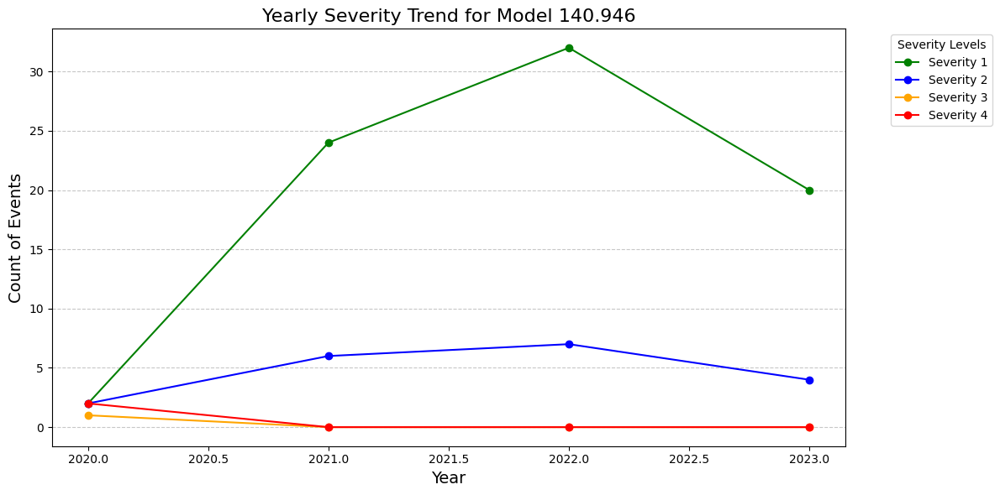

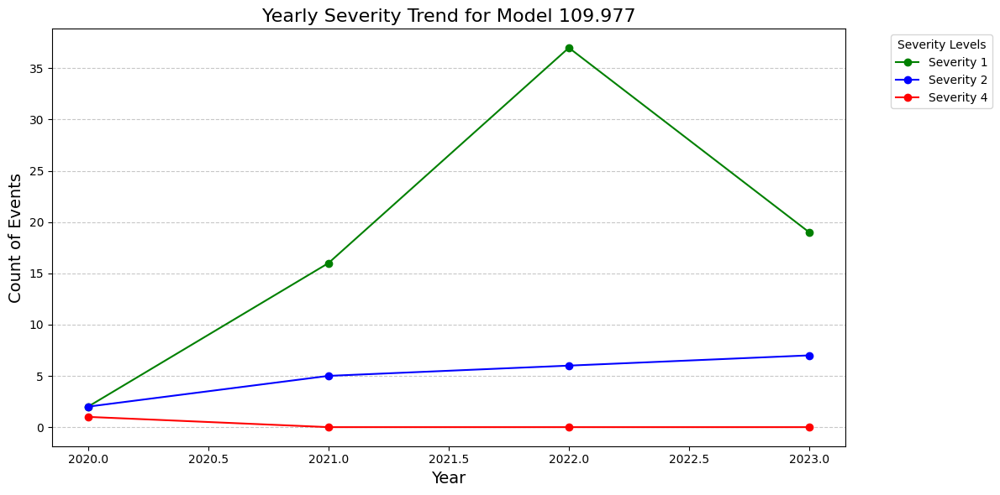

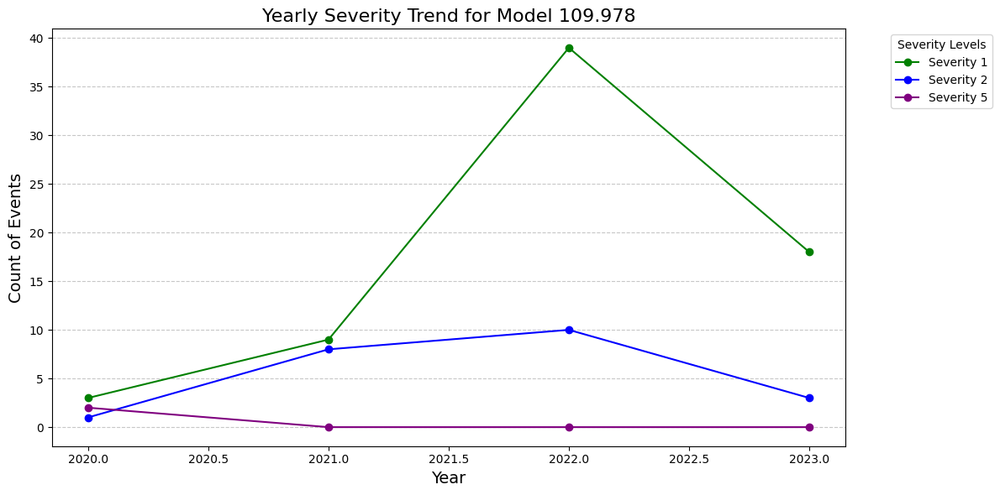

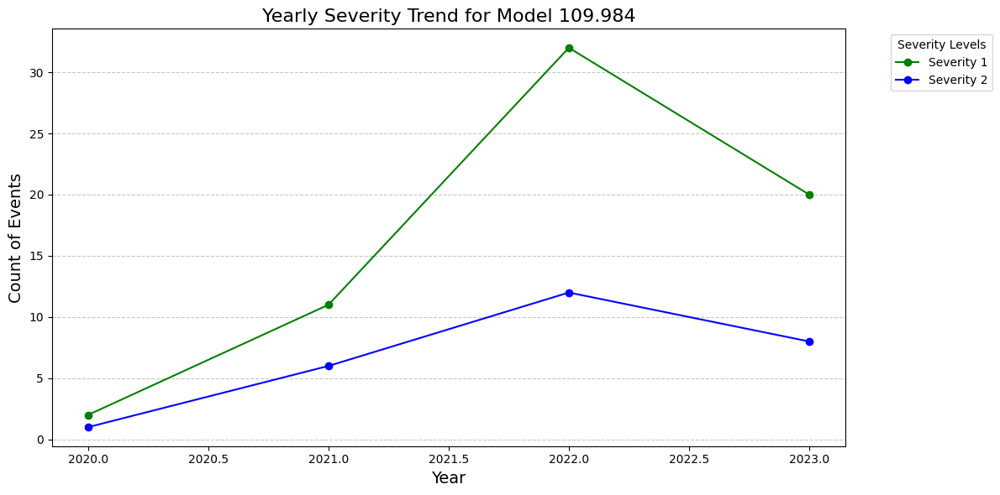

In [ ]:
# Identify the top 10 most used models
top_models = df_combined['MODEL_NUMBER'].value_counts().head(10).index

# Loop through each model in the top 10
for model in top_models:
    # Filter the dataset for the current model
    model_df = df_combined[df_combined['MODEL_NUMBER'] == model]
    
    # Group by year and severity level, then count occurrences
    model_yearly_trends = model_df.groupby(['YEAR', 'SEVERITY_LEVEL']).size().reset_index(name='Count')
    
    # Pivot the data for visualization
    pivot_trends = model_yearly_trends.pivot(index='YEAR', columns='SEVERITY_LEVEL', values='Count').fillna(0)
    
    
    # Plot yearly trends for the current model
    plt.figure(figsize=(12, 6))
    for severity_level, color in severity_colors.items():
        if severity_level in pivot_trends.columns:
            plt.plot(
                pivot_trends.index, 
                pivot_trends[severity_level], 
                label=f'Severity {severity_level}', 
                color=color, 
                marker='o'
            )
    
    # Show the plot
    plt.title(f'Yearly Severity Trend for Model {model}', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Count of Events', fontsize=14)
    plt.legend(title="Severity Levels", fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    plt.show()

<Figure size 1400x800 with 0 Axes>

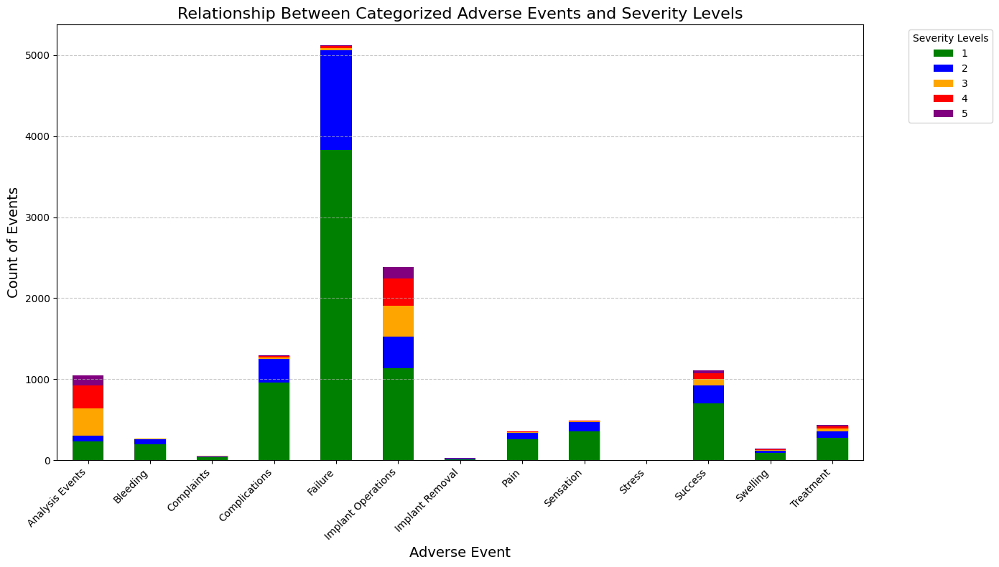

In [ ]:
# Merge df_exploded and df_combined on MDR_REPORT_KEY
merged_df = pd.merge(
    df_exploded[['MDR_REPORT_KEY', 'EVENT_LIST']],
    df_combined[['MDR_REPORT_KEY', 'SEVERITY_LEVEL']],
    on='MDR_REPORT_KEY',
    how='inner'
)

# Group by EVENT_LIST and SEVERITY_LEVEL to count occurrences
event_severity_counts = merged_df.groupby(['EVENT_LIST', 'SEVERITY_LEVEL']).size().unstack(fill_value=0)

# Ensure the columns align with severity_colors
colors = [severity_colors.get(level, 'gray') for level in event_severity_counts.columns]

# Plot a stacked bar chart
plt.figure(figsize=(14, 8))
event_severity_counts.plot(kind='bar', stacked=True, figsize=(14, 8), color=colors)

# Show the plot
plt.title('Relationship Between Categorized Adverse Events and Severity Levels', fontsize=16)
plt.xlabel('Adverse Event', fontsize=14)
plt.ylabel('Count of Events', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Severity Levels", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()
